#### Ski Resort Project University of Zürich 2020
## The test notebook for case5_Les Diablerets_1820_ 1200-3200 m
## setup 1: 9000 experiments 200 scenarios & 45 Policies

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [1]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\em_framework\optimization.py:48: ImportWarning: platypus based optimization not available
  warnings.warn("platypus based optimization not available", ImportWarning)


### *Seting up the display extent*

In [2]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLRM Framework

## Step 5: Model deployment

### Loading the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [3]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\setup1'
root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\setup1'

rootOut = os.path.join(root, 'Results_3')
fh = os.path.join(rootOut, '9000_runs.tar.gz')
experiments, outcomes = load_results(fh)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\setup1\Results_3\9000_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [4]:
print(experiments.shape)
print(list(experiments.keys()))
print(list(outcomes.keys()))

(9000, 12)
['X2fM', 'X3iPot', 'X5temp', 'X6tempArt', 'Xfactor1', 'xClimateModel', 'xRCP', 'x1SnowThershold', 'xGoodDays', 'scenario', 'policy', 'model']
['S_Ave_GoodDay', 'GCM_RCM', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


#### S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm) 
#### GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)
#### Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)
#### S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)
#### S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort
#### S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points
#### tipping_points: Number of tipping points (1981-2100)

## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

### Pairwise Scatter Plot

[MainProcess/DEBUG] generating pairwise scatter plot


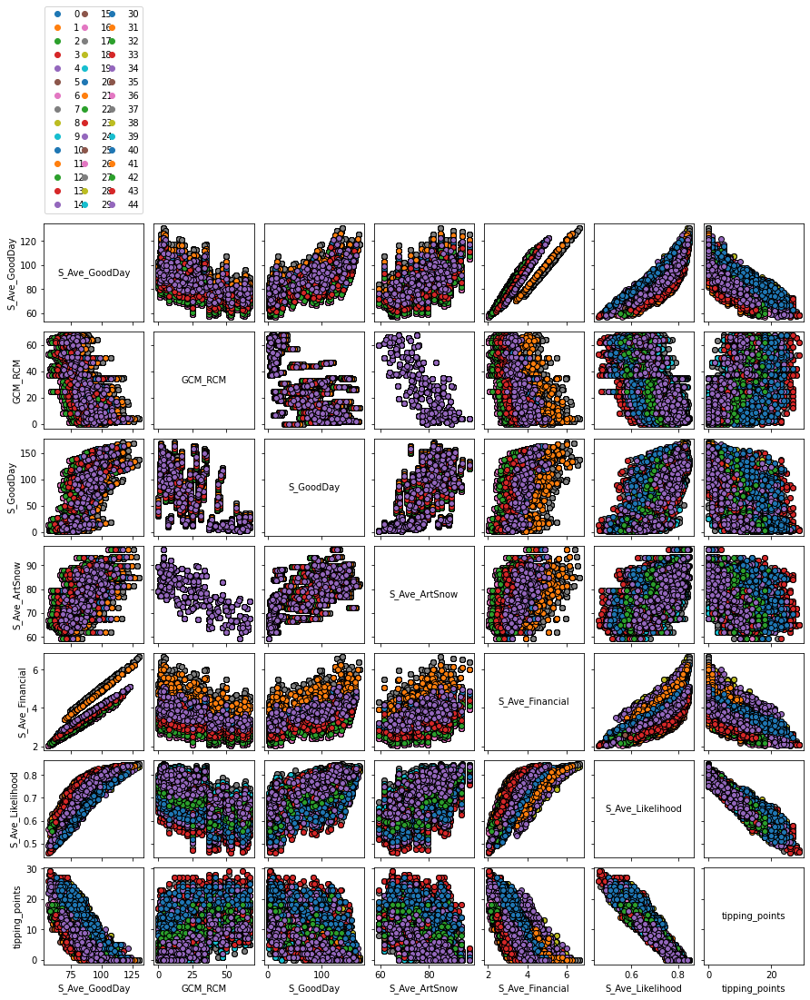

In [5]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)

fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
#fig.savefig(os.path.join(rootOut, 'SA_All_outputs.tiff'), format='tiff', dpi=600)


plt.show()

In [9]:
outcomes2 = outcomes
outcomes2 = outcomes2.pop('GCM_RCM')

KeyError: 'GCM_RCM'

In [10]:
print(outcomes2)

{'S_Ave_GoodDay': array([ 90.85912305, 101.81204949,  88.81201797, ...,  71.40913524,
        87.24494386,  80.09443326]), 'S_GoodDay': array([[ 91.25636   , 166.13964   , 121.83796   , ...,  98.6964    ,
         56.69472   ,  41.49568   ],
       [ 82.36448   ,  95.31556   , 132.3714    , ...,  40.06892   ,
         95.72848   , 127.00192   ],
       [ 92.80704   , 140.6534    , 131.67836   , ..., 112.72568   ,
         60.58408   , 114.56528   ],
       ...,
       [118.614875  , 111.94416667,  80.95108333, ...,  45.31866667,
          8.294375  ,   6.477625  ],
       [135.40579167, 118.86408333, 126.78070833, ...,  55.52120833,
         91.95058333,  25.38966667],
       [116.74229167, 154.56133333,  87.84454167, ...,  42.69241667,
        103.53941667, 101.028625  ]]), 'S_Ave_ArtSnow': array([81.17220339, 82.63305085, 82.83016949, ..., 63.95576271,
       88.27245763, 86.46440678]), 'S_Ave_Financial': array([3.7520339 , 4.20923729, 3.68457627, ..., 3.00686441, 3.70610169,
       

In [11]:
new_dict = {key:val for key, val in outcomes2.items() if key != 'GCM_RCM'} 

In [12]:
print(list(new_dict.keys()))

['S_Ave_GoodDay', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


[MainProcess/DEBUG] generating pairwise scatter plot
No handles with labels found to put in legend.


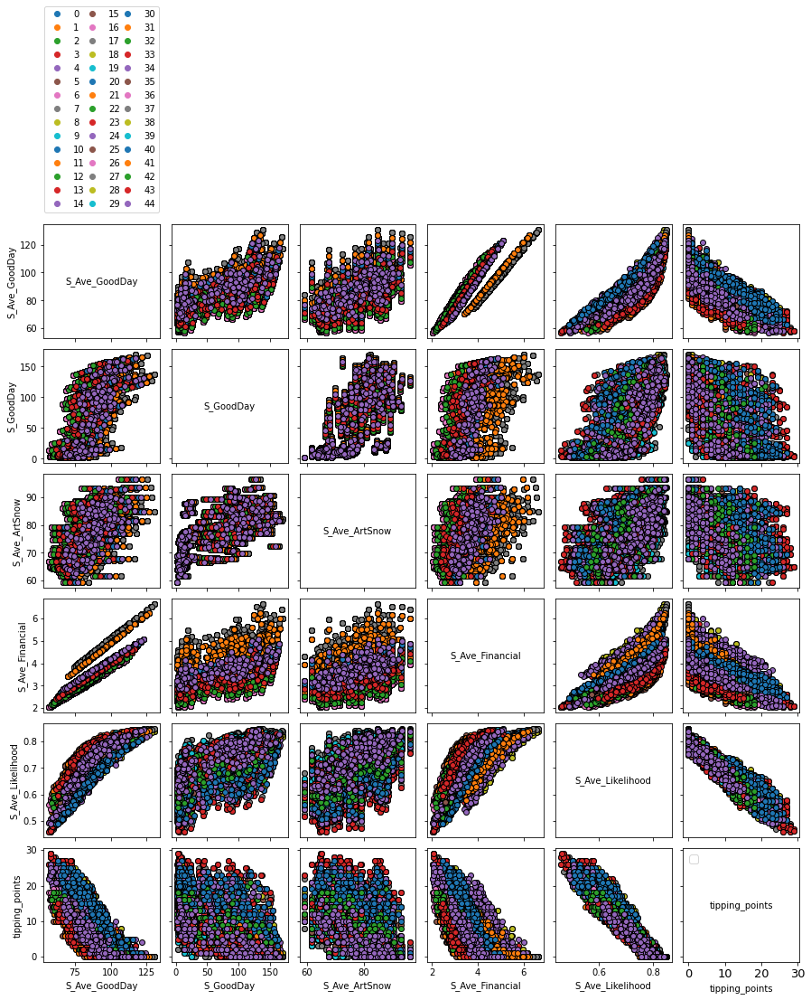

In [13]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, new_dict, group_by='policy',
                                         legend=True)

plt.yticks(fontsize=13)
plt.xticks(fontsize=13)
plt.legend(fontsize=13)

fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.svg'), format='svg', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.tiff'), format='tiff', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.tiff'), format='tiff', dpi=150)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.jpg'), format='jpg', dpi=150)



plt.show()

### Moving the outputs to the folder of results
### Assign the address of outputs folders

In [14]:
import tarfile

shutil.move(os.path.join(root, 'Outputs_py'), os.path.join(rootOut, 'Outputs_py'))
shutil.move(os.path.join(root, 'outSeason'), os.path.join(rootOut, 'outSeason')) 
shutil.move(os.path.join(root, 'outSeason_Likelihood_survival'), os.path.join(rootOut, 'outSeason_Likelihood_survival')) 
shutil.move(os.path.join(root, 'outSeasonArt'), os.path.join(rootOut, 'outSeasonArt')) 
shutil.move(os.path.join(root, 'outSeasonFinancial'), os.path.join(rootOut, 'outSeasonFinancial')) 

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '9000_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '9000_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '9000_runs')

In [15]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'S_Ave_GoodDay.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'GCM_RCM.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'S_GoodDay.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'S_Ave_ArtSnow.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Financial.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Likelihood.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]
df4_ema_y7 = pd.read_csv(os.path.join(out_ema, 'tipping_points.csv'), header=None)
df4_ema_y7.columns = ["Yout7"]

#### Make a database from the outputs of ema framework by concatinating the every output and experiments table

In [16]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6, df4_ema_y7 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.367858,906.900244,5.975780,-1.348101,1.665127,0.213093,2.0,250.0,100.0,0,0,UZHModel,90.859123,16,91.25636,166.13964,121.83796,90.44164,152.69012,146.33272,137.26576,95.72028,154.17752,94.42832,118.81880,124.44728,58.31244,120.12648,93.85380,88.17272,117.15196,136.90880,130.54584,110.97712,...,67.93148,109.60536,60.66636,76.42172,51.10752,31.70984,42.19308,82.55756,51.59868,49.72816,49.46088,33.48840,91.66388,123.83148,46.75504,79.09452,75.12888,104.69336,89.63244,96.89752,116.28800,87.98872,52.62116,76.83068,27.64312,77.48284,81.51884,98.69640,56.69472,41.49568,81.172203,3.752034,0.690467,13.0
1,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,250.0,100.0,1,0,UZHModel,101.812049,14,82.36448,95.31556,132.37140,76.77380,63.79568,128.04792,132.95748,113.76788,133.26144,141.51724,73.48084,136.75036,135.15180,127.09896,113.98116,138.49984,115.00120,100.53124,33.67768,58.85616,...,25.34468,118.80448,71.51828,79.65952,14.51148,70.04876,104.41808,86.80772,29.11472,145.37288,83.10732,94.72668,89.62192,98.29040,96.42140,122.87624,85.65068,118.43712,83.55024,61.32280,147.73836,119.24800,104.97404,133.00480,75.57028,110.43740,58.98192,40.06892,95.72848,127.00192,82.633051,4.209237,0.746784,7.0
2,1.122623,1012.553238,4.772448,-1.069424,0.642826,0.351267,3.0,250.0,100.0,2,0,UZHModel,88.812018,47,92.80704,140.65340,131.67836,98.15732,117.21232,92.41964,86.18460,79.79436,98.11960,97.53036,114.93980,111.66808,117.28576,44.86220,105.86592,123.93400,102.42868,132.85020,89.88388,112.33284,...,40.74128,93.55212,26.26632,61.39108,106.60128,112.99592,9.38032,88.53532,121.97848,41.44204,64.15844,57.91100,74.20720,143.02552,82.43644,49.48548,22.67792,83.45532,99.42924,33.48556,7.82436,82.15044,10.61532,34.12516,35.88768,10.56948,27.03452,112.72568,60.58408,114.56528,82.830169,3.684576,0.673834,12.0
3,1.561398,1040.422515,5.545956,-1.644479,3.050670,0.651938,1.0,250.0,100.0,3,0,UZHModel,93.256771,7,94.67936,126.32468,154.37676,90.78696,165.40276,157.95348,105.67520,135.11460,125.25976,149.03756,138.64276,114.66364,135.76260,123.11688,127.42720,113.55644,103.70952,108.78892,87.17636,68.81472,...,31.74192,75.77164,82.34948,42.03228,90.38108,81.66108,68.47724,50.42908,32.56912,90.77572,113.66548,60.77888,66.54860,46.35568,50.32668,55.52772,45.01244,72.77620,40.99192,97.05936,107.07440,109.50900,15.99532,125.14976,94.65456,33.23372,104.56404,98.67920,71.09696,92.57932,84.320085,3.840847,0.704259,12.0
4,1.098796,1020.768362,5.313310,-1.194926,3.369090,0.186616,2.0,250.0,100.0,4,0,UZHModel,89.041025,16,106.97592,80.24044,136.83964,92.74152,121.24092,108.15840,105.69032,105.09800,111.50828,90.26896,134.94984,148.64836,137.28196,123.51056,122.24044,118.69480,131.19080,80.14828,112.59008,110.15924,...,39.10056,57.17196,40.25524,51.68904,77.47240,52.85768,71.35716,109.80588,109.65832,35.71436,109.06716,105.41412,87.78888,109.13188,78.47476,47.86300,17.81896,104.42208,49.23456,58.31480,134.69836,94.09488,45.52116,68.35772,22.47584,96.02892,71.42208,48.44908,11.62392,103.65056,80.793220,3.664831,0.678780,12.0


In [17]:
df_final_ema.to_csv(os.path.join(rootVisualization, 'df_final_ema.csv'), index = False)

In [18]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [19]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [20]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [21]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

9000
9000
9000
9000


In [22]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [23]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [24]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)


#### Check the header of outputs

In [25]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp
Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp
ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp
isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp


In [26]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [27]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
9000
2142000
<U47
str1504
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000


In [28]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [29]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [30]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[68.05005483]
[82.25678571]
[101.48202315]
[118.27439183]
[128.93100455]
(118, 1)
[2.64]
[3.3175]
[4.22]
[5.]
[5.9]
(118, 1)
[71.925]
[78.63]
[86.365]
[94.9025]
[105.681]
(118, 1)
[80.61791209]
[100.]
[100.]
[100.]
[100.]
(118, 1)


#### Set the parameters of making figure

In [31]:
num_Simulation = 9000
p_Step = 20
alpha_Fade = 0.04

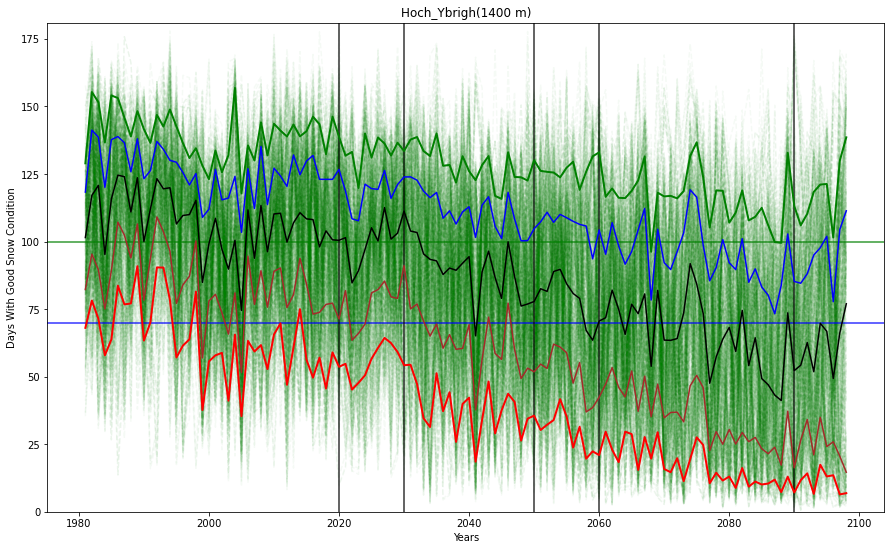

In [32]:
fig1, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(1400 m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig1.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

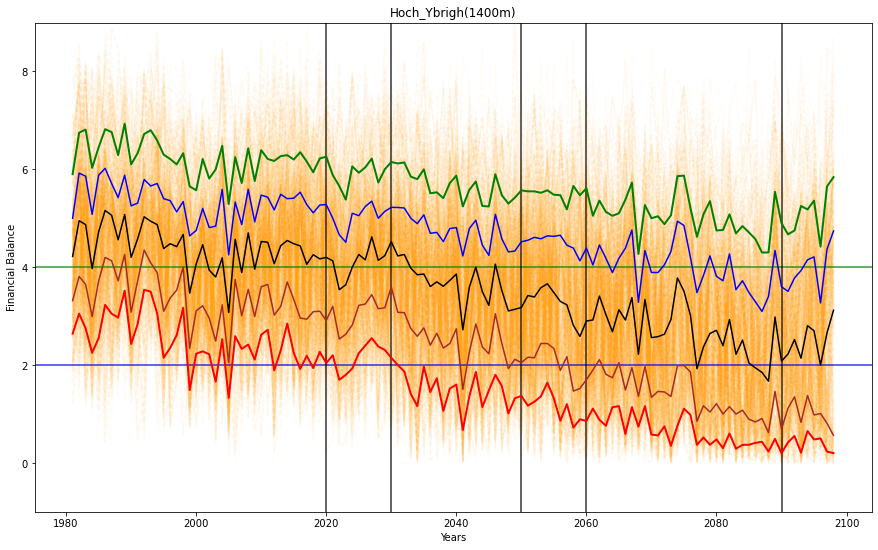

In [33]:
fig2, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Balance')

fig2.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

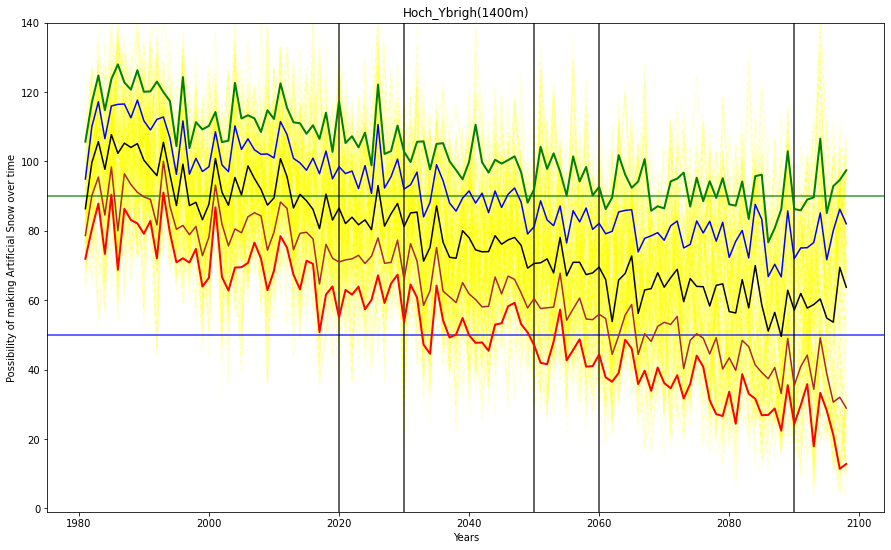

In [34]:
fig3, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig3.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

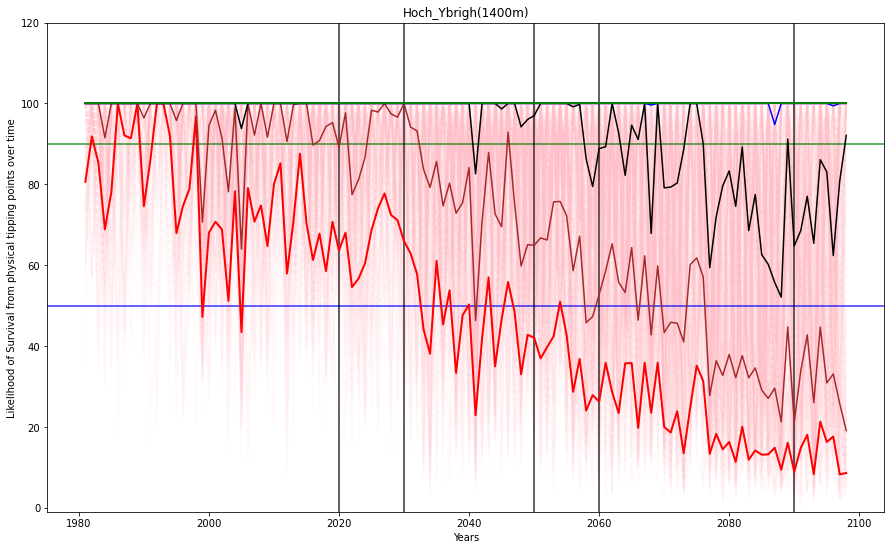

In [35]:
fig4, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig4.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

In [36]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['S_Ave_GoodDay'] < 70
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 1075 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9047619047619048, mass: 0.058333333333333334, coverage: 0.4418604651162791, density: 0.9047619047619048 restricted_dimensions: 6


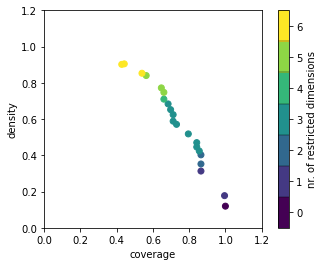

<Figure size 432x288 with 0 Axes>

In [37]:
#import mpld3
#fig, axs = plt.subplots()
#fig5, axs = plt.subplots(figsize=(15,9))
box1.show_tradeoff()
plt.show()
plt.savefig(os.path.join(rootVisualization, 'coverage_density_1.png'))
            
#mpld3.display()
#fig5.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage     0.539535
density      0.852941
id                 18
mass        0.0755556
mean         0.852941
res_dim             6
Name: 18, dtype: object

                                       box 18                                \
                                          min                           max   
X5temp                                4.50381                       5.44705   
xRCP                                      2.5                             3   
x1SnowThershold  {290.0, 300.0, 270.0, 280.0}  {290.0, 300.0, 270.0, 280.0}   
Xfactor1                             0.697031                       3.47752   
xClimateModel                       0.0252641                      0.999203   
X2fM                                  1.04947                       1.60833   

                                                 
                                      qp values  
X5temp            [-1.0, 7.251146158260857e-44]  
xRCP              [3.08937079468154e-169, -1.0]  
x1SnowTher

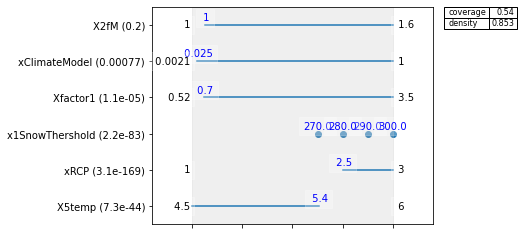

In [38]:
# Saeed : explore the inspect effect
box1.inspect(18)
box1.inspect(18, style='graph')
plt.show()

x1SnowThershold [290.0, 300.0, 270.0, 280.0, 260.0, 200.0, 240.0, 250.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


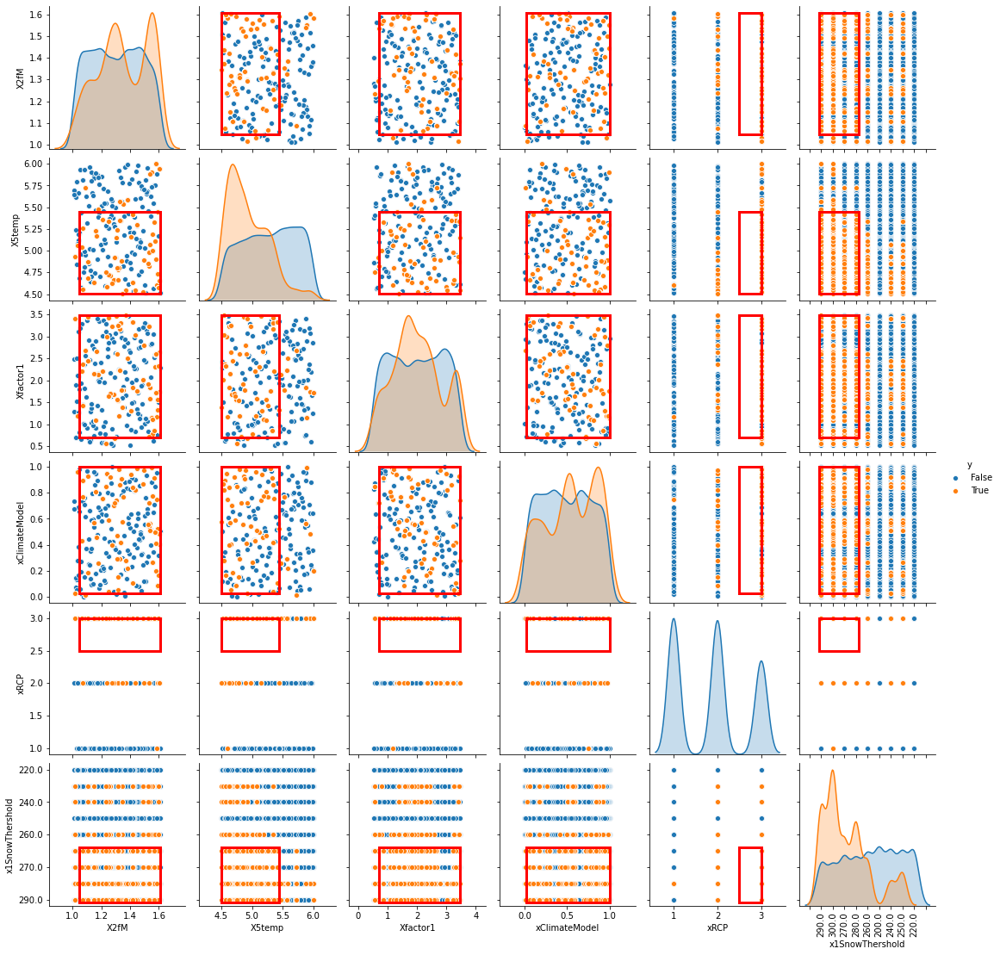

In [39]:
# fig, axs = plt.subplots()
axs1 = box1.show_pairs_scatter(18)
plt.show()
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.svg'), format='svg', dpi=600)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.tiff'), format='tiff', dpi=300)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_70.tiff'), format='tiff', dpi=150)

In [ ]:
box2 = prim_alg.find_box()

In [ ]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
#fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

In [ ]:
# Saeed : explore the inspect effect
box2.inspect(15)
box2.inspect(15, style='graph')
plt.show()

In [ ]:
# fig, axs = plt.subplots()
axs2 = box2.show_pairs_scatter(15)
plt.show()
axs2.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_.svg'), format='svg', dpi=300)

### Artifical snow analysis

In [40]:
x = experiments
y = outcomes['S_Ave_ArtSnow'] < 70
prim_alg = prim.Prim(x, y, threshold=0.8)
box3 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 1845 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9722222222222222, mass: 0.18, coverage: 0.8536585365853658, density: 0.9722222222222222 restricted_dimensions: 3


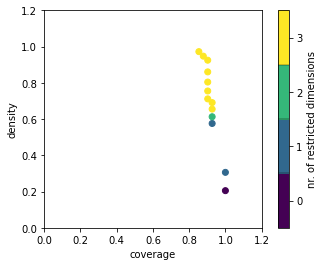

In [41]:
box3.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.926829
density     0.655172
id                 4
mass            0.29
mean        0.655172
res_dim            3
Name: 4, dtype: object

              box 4                                          
                min       max                       qp values
X6tempArt -1.998930 -1.057623   [-1.0, 4.405121782132011e-06]
X2fM       1.010552  1.576944  [-1.0, 0.00034311684676843025]
xRCP       2.500000  3.000000                     [0.0, -1.0]



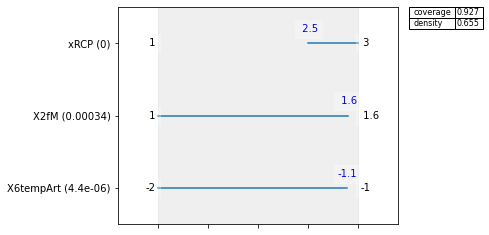

In [42]:
# Saeed : explore the inspect effect
box3.inspect(4)
box3.inspect(4, style='graph')
plt.show()

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


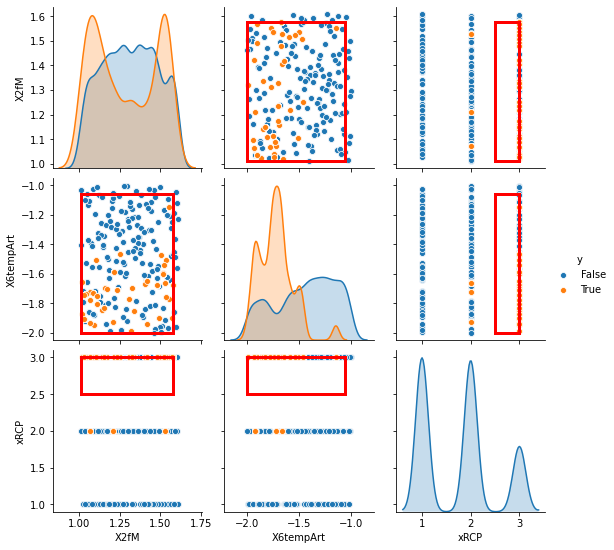

In [43]:
#fig, axs = plt.subplots()
axs4 = box3.show_pairs_scatter(4)
plt.show()
axs4.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial_40.svg'), format='tiff', dpi=300)

### Likelihood of Survival analysis

In [44]:
x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.6
prim_alg = prim.Prim(x, y, threshold=0.7)
box4 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 1113 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9376299376299376, mass: 0.05344444444444445, coverage: 0.4052111410601977, density: 0.9376299376299376 restricted_dimensions: 7


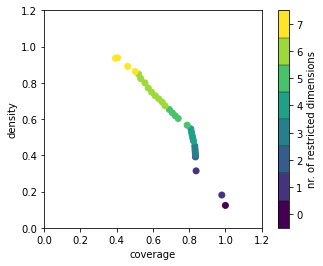

In [45]:
box4.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

coverage    0.820305
density     0.494048
id                10
mass        0.205333
mean        0.494048
res_dim            4
Name: 10, dtype: object

                                                            box 10  \
                                                               min   
xRCP                                                           2.5   
xGoodDays                                {100.0, 70.0, 80.0, 90.0}   
policy           {0, 1, 3, 4, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16...   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250...   

                                                                    \
                                                               max   
xRCP                                                             3   
xGoodDays                                {100.0, 70.0, 80.0, 90.0}   
policy           {0, 1, 3, 4, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16...   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250...   

       

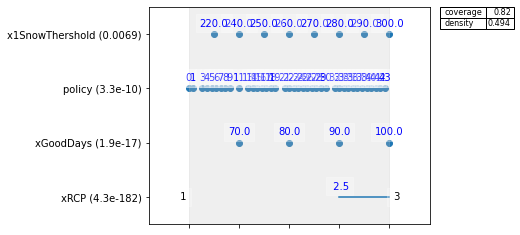

In [46]:
# Saeed : explore the inspect effect
box4.inspect(10)
box4.inspect(10, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250.0, 220.0, 200.0]
xGoodDays [100.0, 70.0, 80.0, 90.0, 60.0]
policy [0, 1, 3, 4, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 2, 10, 12, 44, 20, 31]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


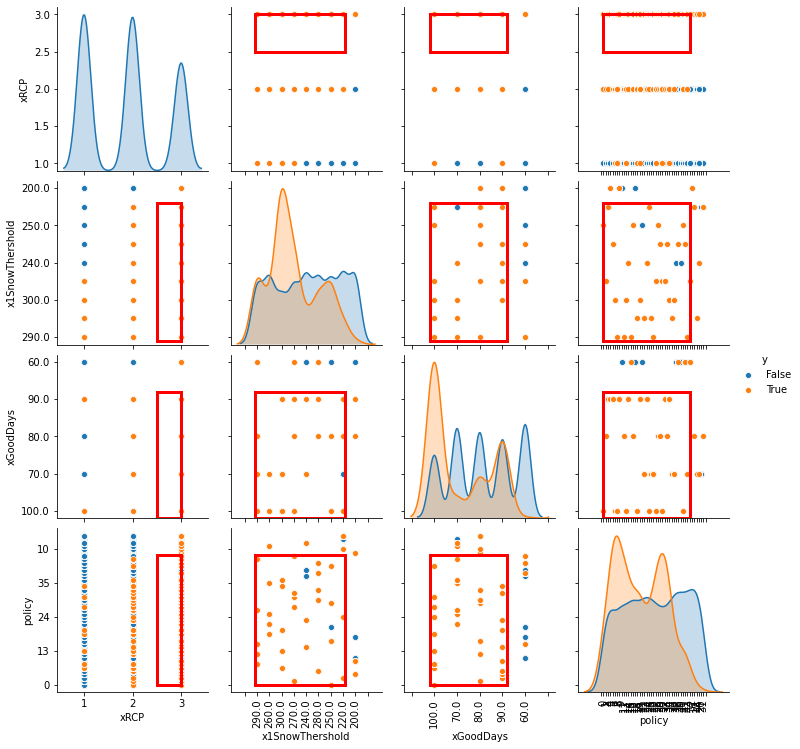

In [47]:
#fig, axs = plt.subplots()
axs3 = box4.show_pairs_scatter(10)
plt.show()
axs3.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Tipping points analysis

In [48]:
x = experiments
y = outcomes['tipping_points'] < 15
prim_alg = prim.Prim(x, y, threshold=0.8)
box5 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 7082 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.381, coverage: 0.4841852584015815, density: 1.0 restricted_dimensions: 3


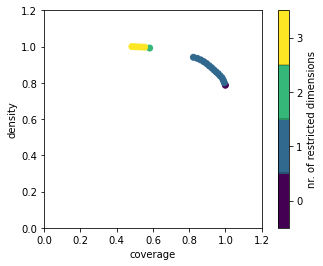

In [49]:
box5.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.581898
density     0.992056
id                15
mass        0.461556
mean        0.992056
res_dim            2
Name: 15, dtype: object

                                                   box 15  \
                                                      min   
xRCP                                                    1   
policy  {1, 2, 3, 4, 8, 9, 10, 12, 14, 15, 16, 17, 20,...   

                                                           \
                                                      max   
xRCP                                                  2.5   
policy  {1, 2, 3, 4, 8, 9, 10, 12, 14, 15, 16, 17, 20,...   

                                         
                              qp values  
xRCP       [-1.0, 1.05149223320153e-67]  
policy  [2.5275864514323625e-191, -1.0]  



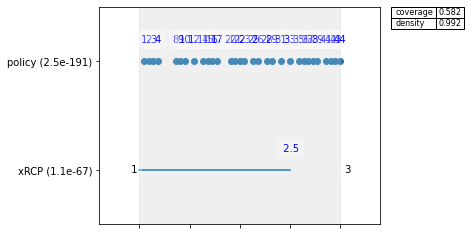

In [50]:
# Saeed : explore the inspect effect
box5.inspect(15)
box5.inspect(15, style='graph')
plt.show()

policy [1, 2, 3, 4, 8, 9, 10, 12, 14, 15, 16, 17, 20, 21, 22, 23, 25, 26, 28, 29, 31, 33, 35, 36, 37, 38, 39, 41, 42, 43, 44, 0, 32, 34, 5, 6, 7, 40, 11, 13, 18, 19, 24, 27, 30]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


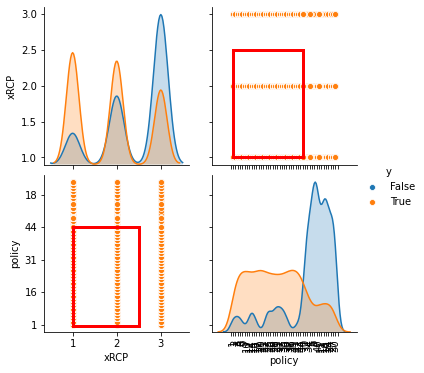

In [51]:
#fig, axs = plt.subplots()
axs5 = box5.show_pairs_scatter(15)
plt.show()

axs5.savefig(os.path.join(rootVisualization, 'multigraphs_tippingpoints.svg'), format='svg', dpi=300)

### Visualization with ema-workbench - part3

In [52]:
experiments2 = experiments
experiments2 = experiments2.pop('policy')

In [53]:
new_dict_experiments = {key:val for key, val in experiments2.items() if key != 'policy'} 

In [54]:
sns.set(font_scale=1.5)

ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.14,linecolor="grey",
                  cbar_kws={'label': 'features ranks','shrink': 0.1})

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


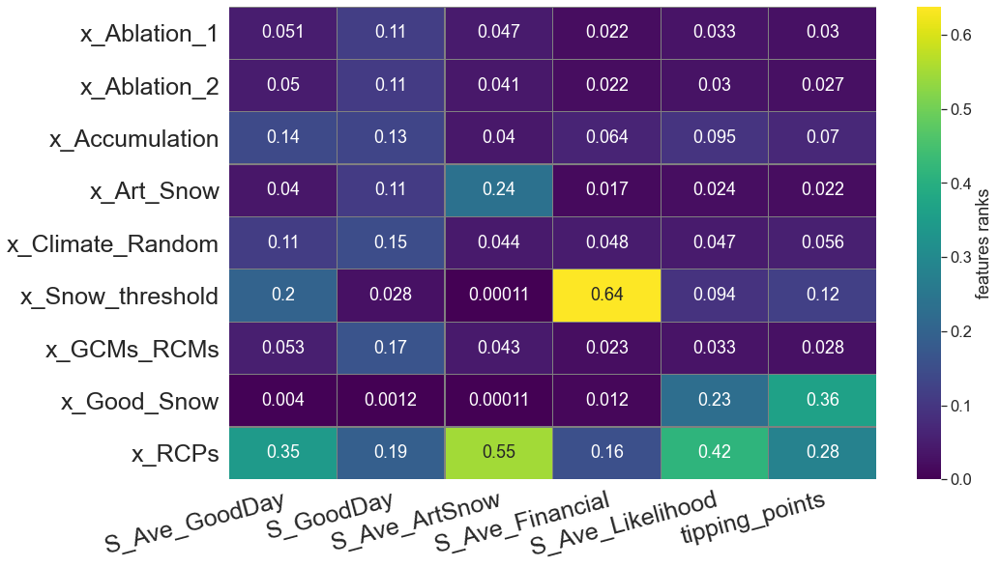

In [55]:
from ema_workbench.analysis import feature_scoring

fig6, ax6 = plt.subplots(figsize=(15,9))

x = experiments
#x = new_dict_experiments
#Y = outcomes
Y = new_dict
fs = feature_scoring.get_feature_scores_all(x, Y)
ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.28,linecolor="grey",
                  cbar_kws={'label': 'features ranks'})

# Rotate the tick labels and set their alignment.
plt.setp(ax6.get_xticklabels(), rotation=15, size = 25, ha="right",
         rotation_mode="anchor")

ylabels = ['x_Ablation_1', 'x_Ablation_2', 'x_Accumulation', 'x_Art_Snow', 'x_Climate_Random', 'x_Snow_threshold', 'x_GCMs_RCMs', 'x_Good_Snow', 'x_RCPs']
ax6.set_yticklabels(ylabels)
plt.setp(ax6.get_yticklabels(), rotation=0, size = 25, ha="right", rotation_mode="anchor")

#ax6.legend(size=13)

plt.show()

fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=300)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.tiff'), format='tiff', dpi=150)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.jpg'), format='jpg', dpi=150)

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

[MainProcess/INFO] model dropped from analysis because only a single category


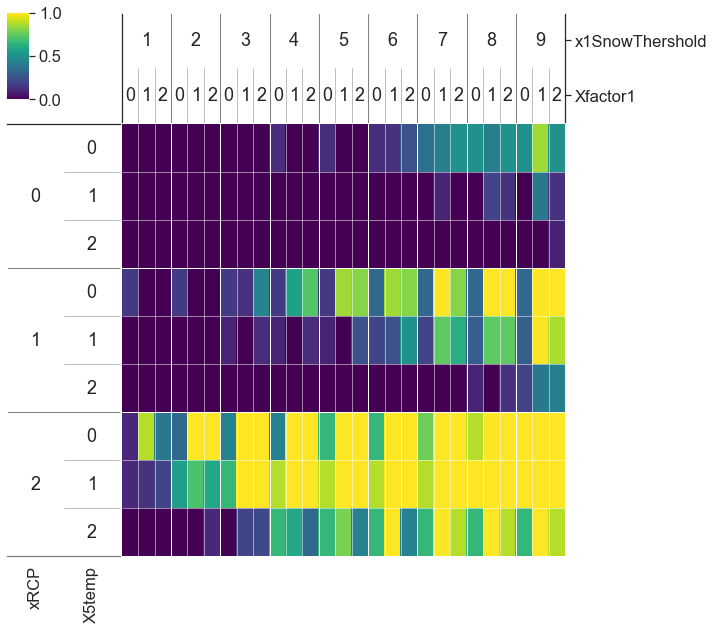

In [63]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_GoodDay'] < 80
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


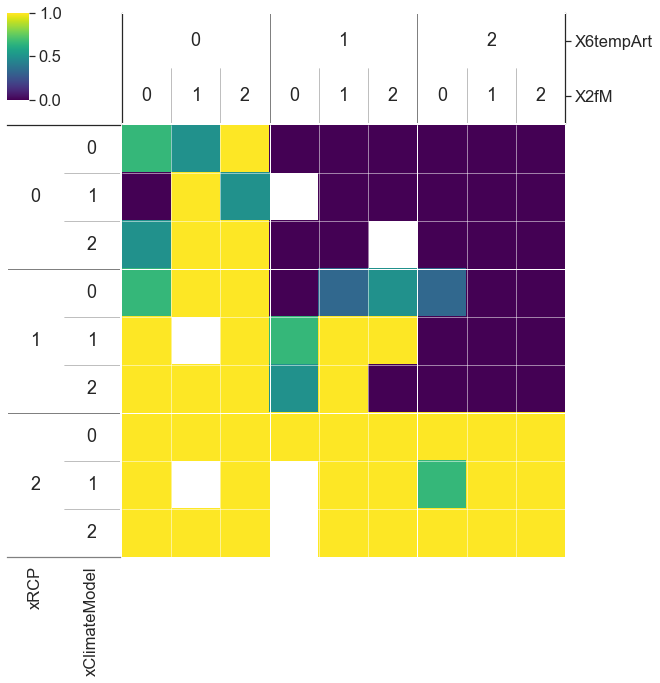

In [64]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_ArtSnow'] < 80
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=300)

[MainProcess/INFO] model dropped from analysis because only a single category


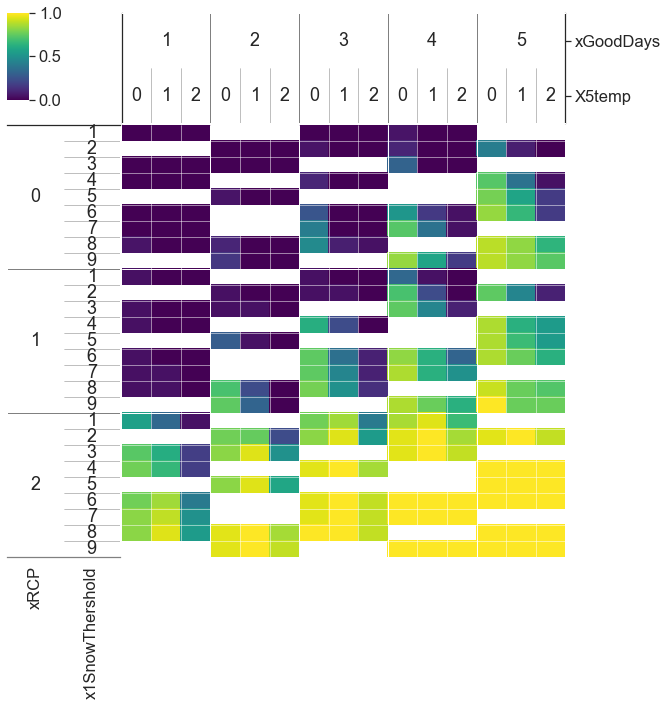

In [65]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.7
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

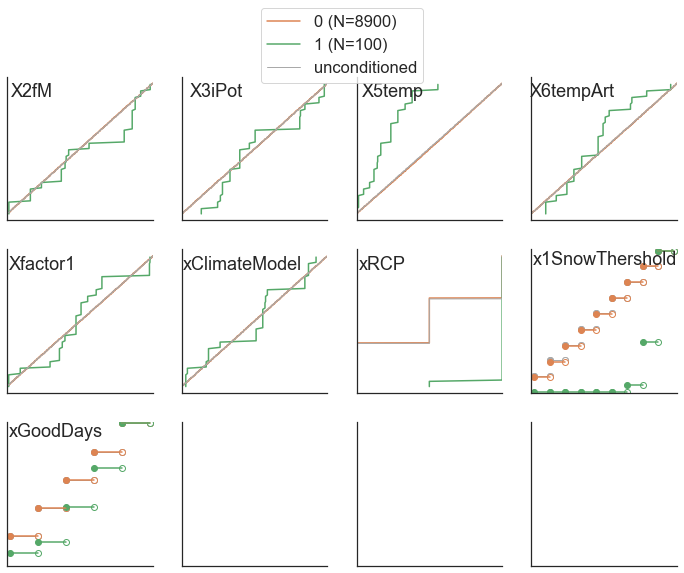

In [66]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_GoodDay'] < 60
fig10 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig10.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

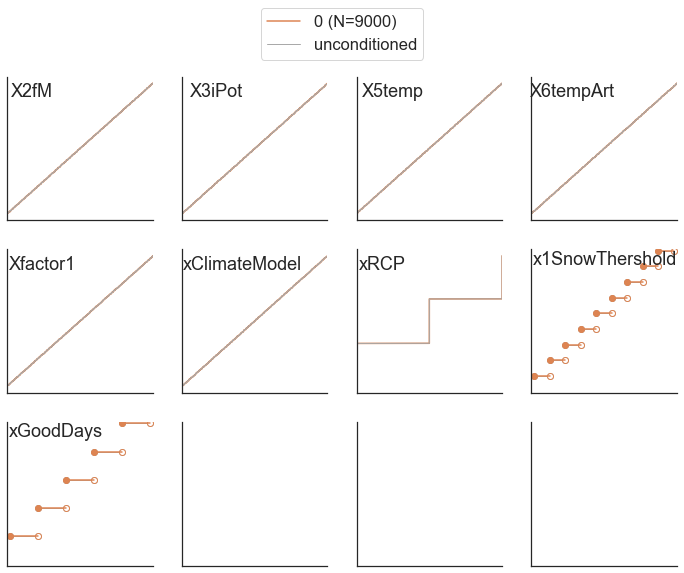

In [67]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_ArtSnow'] < 50
fig12 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig12.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

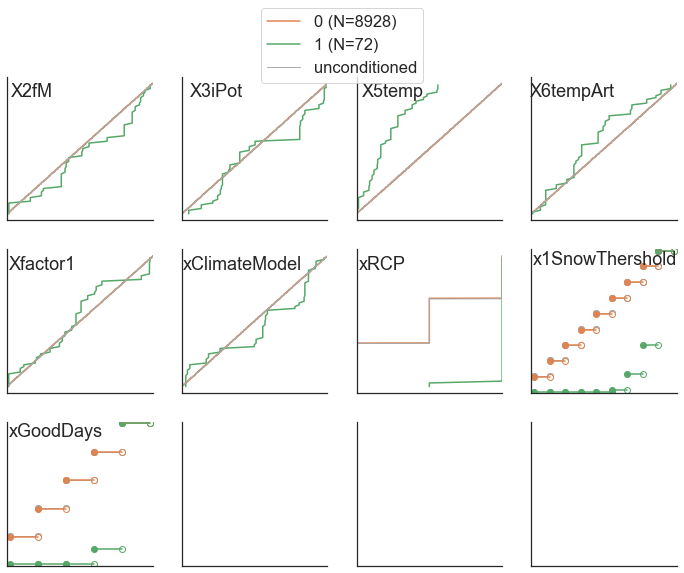

In [68]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_Likelihood'] < 0.5
fig11 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

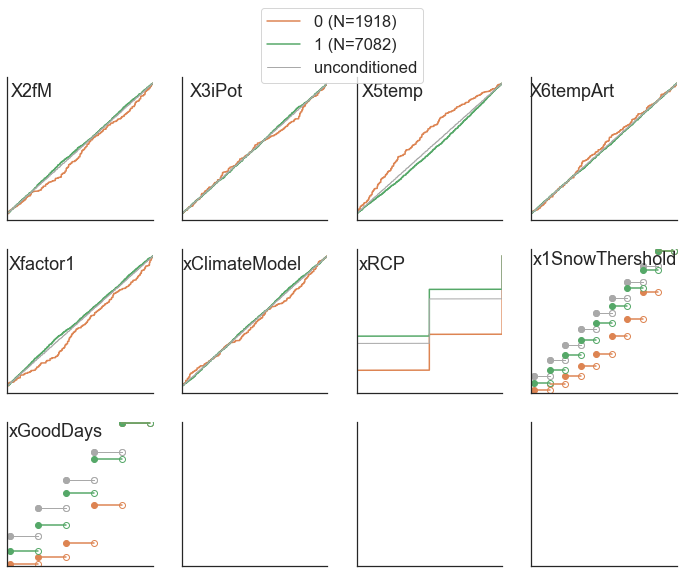

In [69]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['tipping_points'] < 15
fig11_2 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11_2.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_tipping_points.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

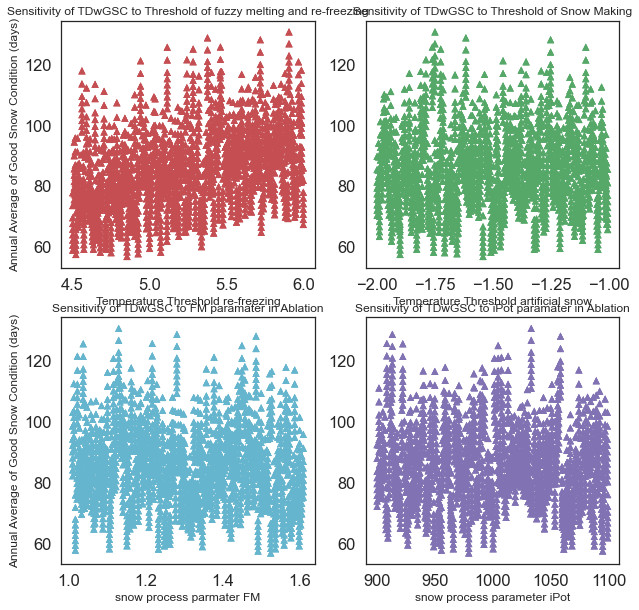

In [70]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig13, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing", size = 12)
axs[0,1].set_xlabel("Temperature Threshold artificial snow", size = 12)
axs[1,0].set_xlabel("snow process parmater FM",size = 12)
axs[1,1].set_xlabel("snow process parameter iPot", size = 12)


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing', size = 12)
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making', size = 12)
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation', size = 12)
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation', size = 12)


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig13.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

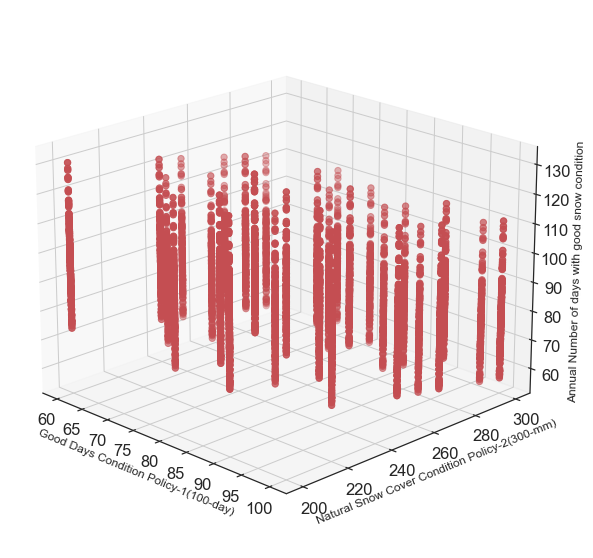

In [71]:
from mpl_toolkits.mplot3d import Axes3D 
fig14 = plt.figure(figsize=(15,10))
ax = fig14.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)', size = 12)
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)', size = 12)
ax.set_zlabel('Annual Number of days with good snow condition', size = 12)


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig14.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

In [72]:
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.367858,906.900244,5.975780,-1.348101,1.665127,0.213093,2.0,250.0,100.0,0,0,UZHModel,90.859123,16,91.25636,166.13964,121.83796,90.44164,152.69012,146.33272,137.26576,95.72028,154.17752,94.42832,118.81880,124.44728,58.31244,120.12648,93.85380,88.17272,117.15196,136.90880,130.54584,110.97712,...,67.93148,109.60536,60.66636,76.42172,51.10752,31.70984,42.19308,82.55756,51.59868,49.72816,49.46088,33.48840,91.66388,123.83148,46.75504,79.09452,75.12888,104.69336,89.63244,96.89752,116.28800,87.98872,52.62116,76.83068,27.64312,77.48284,81.51884,98.69640,56.69472,41.49568,81.172203,3.752034,0.690467,13.0
1,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,250.0,100.0,1,0,UZHModel,101.812049,14,82.36448,95.31556,132.37140,76.77380,63.79568,128.04792,132.95748,113.76788,133.26144,141.51724,73.48084,136.75036,135.15180,127.09896,113.98116,138.49984,115.00120,100.53124,33.67768,58.85616,...,25.34468,118.80448,71.51828,79.65952,14.51148,70.04876,104.41808,86.80772,29.11472,145.37288,83.10732,94.72668,89.62192,98.29040,96.42140,122.87624,85.65068,118.43712,83.55024,61.32280,147.73836,119.24800,104.97404,133.00480,75.57028,110.43740,58.98192,40.06892,95.72848,127.00192,82.633051,4.209237,0.746784,7.0
2,1.122623,1012.553238,4.772448,-1.069424,0.642826,0.351267,3.0,250.0,100.0,2,0,UZHModel,88.812018,47,92.80704,140.65340,131.67836,98.15732,117.21232,92.41964,86.18460,79.79436,98.11960,97.53036,114.93980,111.66808,117.28576,44.86220,105.86592,123.93400,102.42868,132.85020,89.88388,112.33284,...,40.74128,93.55212,26.26632,61.39108,106.60128,112.99592,9.38032,88.53532,121.97848,41.44204,64.15844,57.91100,74.20720,143.02552,82.43644,49.48548,22.67792,83.45532,99.42924,33.48556,7.82436,82.15044,10.61532,34.12516,35.88768,10.56948,27.03452,112.72568,60.58408,114.56528,82.830169,3.684576,0.673834,12.0
3,1.561398,1040.422515,5.545956,-1.644479,3.050670,0.651938,1.0,250.0,100.0,3,0,UZHModel,93.256771,7,94.67936,126.32468,154.37676,90.78696,165.40276,157.95348,105.67520,135.11460,125.25976,149.03756,138.64276,114.66364,135.76260,123.11688,127.42720,113.55644,103.70952,108.78892,87.17636,68.81472,...,31.74192,75.77164,82.34948,42.03228,90.38108,81.66108,68.47724,50.42908,32.56912,90.77572,113.66548,60.77888,66.54860,46.35568,50.32668,55.52772,45.01244,72.77620,40.99192,97.05936,107.07440,109.50900,15.99532,125.14976,94.65456,33.23372,104.56404,98.67920,71.09696,92.57932,84.320085,3.840847,0.704259,12.0
4,1.098796,1020.768362,5.313310,-1.194926,3.369090,0.186616,2.0,250.0,100.0,4,0,UZHModel,89.041025,16,106.97592,80.24044,136.83964,92.74152,121.24092,108.15840,105.69032,105.09800,111.50828,90.26896,134.94984,148.64836,137.28196,123.51056,122.24044,118.69480,131.19080,80.14828,112.59008,110.15924,...,39.10056,57.17196,40.25524,51.68904,77.47240,52.85768,71.35716,109.80588,109.65832,35.71436,109.06716,105.41412,87.78888,109.13188,78.47476,47.86300,17.81896,104.42208,49.23456,58.31480,134.69836,94.09488,45.52116,68.35772,22.47584,96.02892,71.42208,48.44908,11.62392,103.65056,80.793220,3.664831,0.678780,12.0


# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [73]:
df_final_ema.tail()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
8995,1.532000,1075.197279,4.981082,-1.913179,3.228265,0.541900,2.0,240.0,70.0,195,44,UZHModel,77.866025,25,71.431292,52.427750,105.557667,102.939125,68.750083,87.237083,141.136292,135.032167,129.320708,111.090292,130.167958,120.677500,86.450083,118.579417,124.355250,53.599292,106.635125,56.578792,31.750125,100.903125,...,6.340542,3.276375,30.588542,106.816083,83.265125,61.634833,18.948417,67.101458,81.639958,126.703292,50.899250,70.035208,58.639250,66.198042,15.255667,55.134792,73.231667,56.200625,95.374917,98.825042,87.895417,30.546292,51.101458,59.289417,88.939917,70.409000,12.205417,29.133417,59.388250,13.892625,71.956102,3.317034,0.714359,8.0
8996,1.034402,974.926721,5.080666,-1.921294,2.115187,0.281357,2.0,240.0,70.0,196,44,UZHModel,85.530512,18,134.841458,133.383917,87.103458,69.014917,124.972250,136.693708,92.629458,103.202792,102.377708,83.390292,118.571042,119.486167,125.348375,106.012458,83.134125,110.652292,77.878417,127.038417,56.288167,108.658625,...,99.375000,15.597708,25.900792,65.212875,83.412875,75.561292,97.577792,58.122792,69.398917,127.576542,18.622250,38.932500,59.656792,113.384042,12.096875,92.318375,72.242875,81.796208,43.044000,93.496917,64.659333,89.775167,77.322250,86.253792,89.336750,109.322042,88.404917,22.647125,37.013917,65.092875,72.786356,3.596780,0.753528,4.0
8997,1.420934,909.525625,4.631012,-1.936505,1.830015,0.839097,3.0,240.0,70.0,197,44,UZHModel,71.409135,62,118.614875,111.944167,80.951083,60.791625,158.226333,152.095083,149.597833,88.645417,85.946708,110.433167,94.373500,130.174375,59.284500,120.073958,125.692167,133.218000,94.006917,86.905292,118.634333,87.279500,...,10.667875,81.686333,80.315583,56.083292,22.063500,48.263667,54.097875,35.921958,28.069500,36.828625,19.944833,34.972500,76.442792,34.554125,18.155250,89.645000,5.557625,3.718417,24.292333,6.309708,10.000083,47.395125,38.657000,43.249708,5.560792,72.313000,10.028125,45.318667,8.294375,6.477625,63.955763,3.006864,0.634964,11.0
8998,1.401694,936.565859,4.862144,-1.315260,0.522722,0.826641,1.0,240.0,70.0,198,44,UZHModel,87.244944,9,135.405792,118.864083,126.780708,132.555708,86.155333,160.444125,121.323083,116.274375,42.907917,88.176125,72.126000,47.110167,104.614167,125.145542,33.820625,150.111292,154.817875,121.384917,91.507667,114.912167,...,19.351250,34.954458,66.582958,32.231625,82.457750,121.190292,72.602375,111.688583,12.201083,64.178958,133.106917,53.840292,112.099583,152.759917,24.089750,100.691958,16.380875,28.226583,144.710333,90.929167,58.589208,32.274000,117.687458,124.101292,80.706083,36.237333,139.879125,55.521208,91.950583,25.389667,88.272458,3.706102,0.729884,3.0
8999,1.583904,1011.509954,4.604421,-1.188755,1.167802,0.745613,1.0,240.0,70.0,199,44,UZHModel,80.094433,8,116.742292,154.561333,87.844542,37.086375,155.247458,133.572000,134.529292,82.927542,93.874750,101.953083,120.393042,131.695792,93.468000,80.851000,73.305417,118.361875,100.394500,123.002958,79.895417,112.591208,...,99.899292,89.628167,103.888417,34.893875,22.649667,107.760875,142.410875,77.725625,52.827458,59.064708,16.267958,84.225000,3.512333,31.505125,42.043458,114.238375,74.835583,9.168208,25.319167,33.524083,44.960083,107.390333,65.588333,27.995292,77.149208,93.127958,16.291792,42.692417,103.539417,101.028625,86.464407,3.384153,0.704914,5.0


In [74]:
filt_S = (df_final_ema['scenario'] == 1)
x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']

In [75]:
x_policy[1]

250.0

In [76]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,250.0,100.0,1,0,UZHModel,101.812049,14,82.364480,95.315560,132.371400,76.773800,63.795680,128.047920,132.957480,113.767880,133.261440,141.517240,73.480840,136.750360,135.151800,127.098960,113.981160,138.499840,115.001200,100.531240,33.677680,58.856160,...,25.344680,118.804480,71.518280,79.659520,14.511480,70.048760,104.418080,86.807720,29.114720,145.372880,83.107320,94.726680,89.621920,98.290400,96.421400,122.876240,85.650680,118.437120,83.550240,61.322800,147.738360,119.248000,104.974040,133.004800,75.570280,110.437400,58.981920,40.068920,95.728480,127.001920,82.633051,4.209237,0.746784,7.0
201,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,270.0,80.0,1,1,UZHModel,97.384068,14,76.263407,91.713185,127.681074,71.086852,59.070074,121.850852,131.409185,110.134000,128.932222,138.554296,68.912741,133.151593,129.367370,125.832370,109.225000,134.337889,112.603852,95.142222,31.183037,54.496444,...,23.467296,112.321407,66.220630,74.914296,13.436556,64.859963,101.779259,81.388037,26.958074,142.848741,76.951222,88.275630,85.204259,91.009630,93.090185,118.923889,79.319296,112.075296,77.361333,56.782519,144.188370,115.213185,100.930519,129.654630,69.972481,106.854741,54.612889,37.100852,90.381519,119.947185,82.633051,3.861186,0.778421,2.0
401,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,200.0,80.0,1,2,UZHModel,113.435764,14,99.690550,103.176100,145.742600,93.939100,79.299350,141.426300,136.833850,123.713000,144.143500,150.270000,85.106700,143.737150,148.373800,131.097000,126.512450,150.494000,120.847700,114.012250,42.097100,73.570200,...,31.680850,135.590750,86.567650,90.286200,18.139350,87.560950,110.974050,101.573150,36.393400,150.866700,101.580950,109.302700,101.671650,120.868850,104.723200,131.882450,103.435250,136.362550,101.585400,73.204950,153.925450,130.433600,115.887050,141.151500,94.021600,120.899650,73.727400,50.086150,106.563650,143.865850,82.633051,5.814237,0.812364,0.0
601,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,220.0,90.0,1,3,UZHModel,108.702810,14,92.664091,99.684045,140.093000,86.896455,72.495091,136.085818,135.330000,119.511636,139.562318,146.553136,80.563500,140.809500,142.836500,129.331273,121.520364,145.408909,118.429955,108.948909,38.270091,66.882000,...,28.800773,128.865318,80.283727,86.042136,16.490318,79.600864,108.423091,95.388318,33.084909,148.963864,94.160364,103.370636,96.631591,111.677864,101.721136,128.337636,96.438864,128.582727,94.499136,68.468091,151.765545,125.762682,111.274455,138.089545,85.864409,116.558091,67.024909,45.532864,102.566182,136.809909,82.633051,5.339576,0.790179,1.0
801,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,200.0,90.0,1,4,UZHModel,113.435764,14,99.690550,103.176100,145.742600,93.939100,79.299350,141.426300,136.833850,123.713000,144.143500,150.270000,85.106700,143.737150,148.373800,131.097000,126.512450,150.494000,120.847700,114.012250,42.097100,73.570200,...,31.680850,135.590750,86.567650,90.286200,18.139350,87.560950,110.974050,101.573150,36.393400,150.866700,101.580950,109.302700,101.671650,120.868850,104.723200,131.882450,103.435250,136.362550,101.585400,73.204950,153.925450,130.433600,115.887050,141.151500,94.021600,120.899650,73.727400,50.086150,106.563650,143.865850,82.633051,5.814237,0.801070,0.0
1001,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.

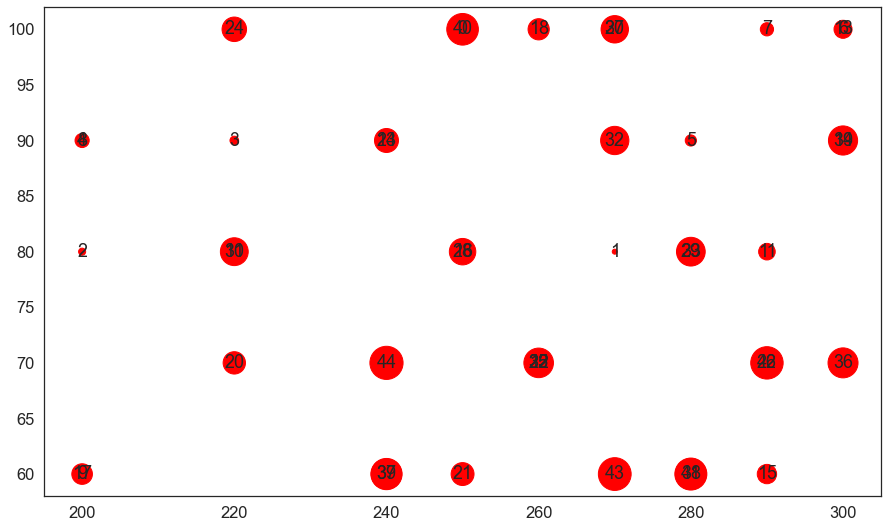

In [77]:
#x_policy = x1SnowThershold 
#y_policy = xGoodDays 

#ranking = np.random.normal(size=9000)
#scenarios = df_final_ema['policy'].values


fig, ax_n = plt.subplots(figsize=(15,9))


x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']
#colors = np.random.rand(N)


# Because the price is much too small when being provided as size for ``s``,
# we normalize it to some useful point sizes, s=0.3*(price*3)**2
ax_n.scatter(x_policy, y_policy, s = scenarios * 25, c = 'red' , cmap="Spectral")

for x_pos, y_pos, label in zip(x_policy, y_policy, scenarios):
    ax_n.annotate(label,
                xy=(x_pos, y_pos),
                xytext=(0, 0),
                textcoords='offset points',
                ha='center',
                va='center')

plt.show()

### Defining the Q0.9 and Q0.1 databases

In [78]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[68.05005483]
[82.25678571]
[101.48202315]
[118.27439183]
[128.93100455]
(118, 1)
[2.64]
[3.3175]
[4.22]
[5.]
[5.9]
(118, 1)
[71.925]
[78.63]
[86.365]
[94.9025]
[105.681]
(118, 1)
[80.61791209]
[100.]
[100.]
[100.]
[100.]
(118, 1)


In [79]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000


In [80]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[3, 0, 1:2])
print(matrix_GoodDays[4].shape)

(9000, 119, 1)
['isOverSnow_SMHI-RCA-MPIESM-EUR11-RCP45-pcp']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [81]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [82]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [83]:
dfq50_26.head()

,median26
0,98.897553
1,117.317966
2,115.023729
3,92.519180
4,117.145920


In [84]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [85]:
dfAllAverages.head()

,median26,median45,median85
0,98.897553,97.843776,106.543098
1,117.317966,109.660800,123.048508
2,115.023729,127.117250,116.709897
3,92.519180,93.152061,100.823180
4,117.145920,112.744613,117.665017


In [86]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[68.05005483]
[82.25678571]
[101.48202315]
[118.27439183]
[128.93100455]
(118, 1)
*** RCP2.6***
[75.48175]
[84.67638462]
[98.89755333]
[115.86544]
[125.1719]
(118, 1)
*** RCP4.5***
[59.78293103]
[73.67481319]
[97.84377643]
[119.30054545]
[129.68266667]
(118, 1)
*** RCP8.5***
[72.66788]
[87.53844444]
[106.5430977]
[119.83513636]
[131.4639]
(118, 1)


In [87]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[2.64]
[3.3175]
[4.22]
[5.]
[5.9]
(118, 1)
*** RCP2.6***
[2.9]
[3.4]
[4.125]
[4.88]
[5.74]
(118, 1)
*** RCP4.5***
[2.31]
[2.975]
[4.11]
[5.02]
[5.78]
(118, 1)
*** RCP8.5***
[2.8]
[3.49]
[4.34]
[5.12]
[6.02]
(118, 1)


#### Set the parameters of making figure

In [88]:
p_Step = 20
alpha_Fade = 0.11

### RCP 2.6 Number of days with Good Snow Condition over the time

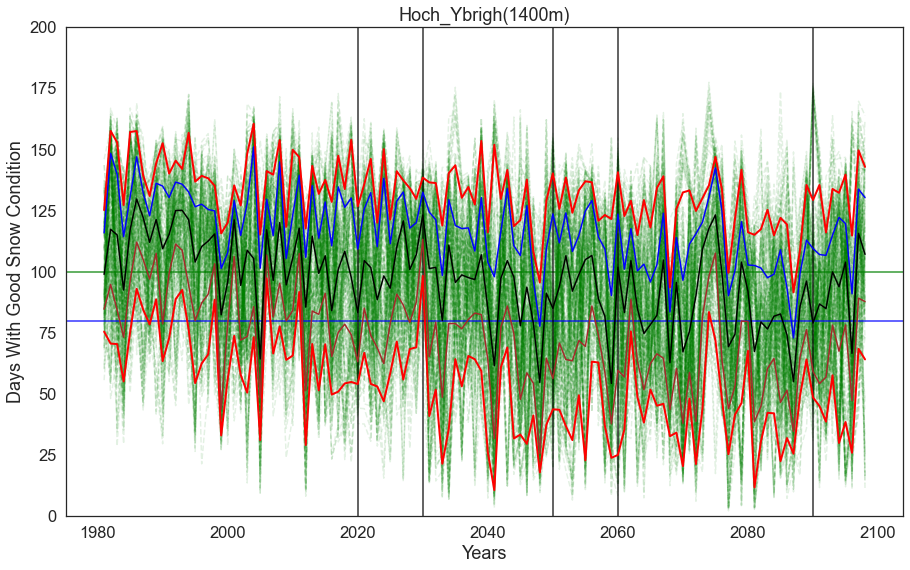

In [89]:
fig15, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig15.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

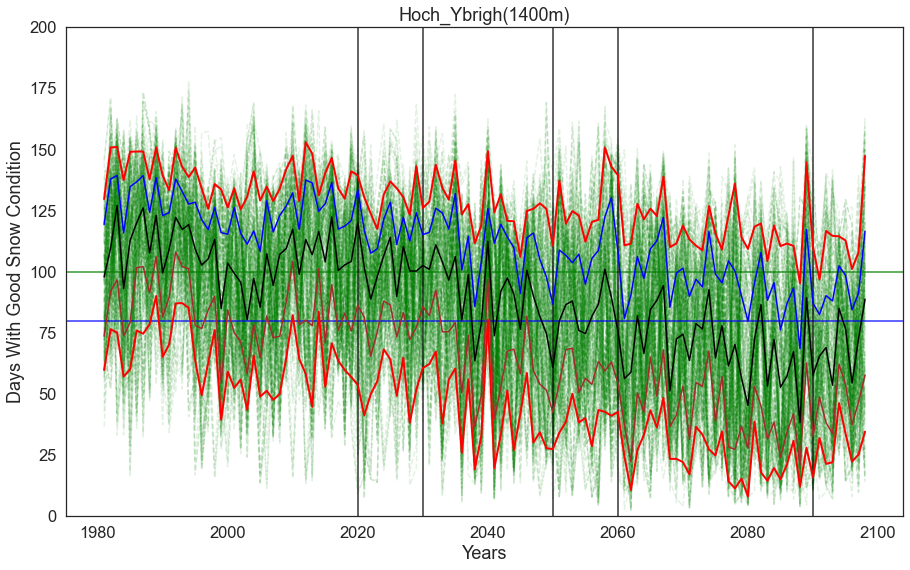

In [90]:
fig16, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig16.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

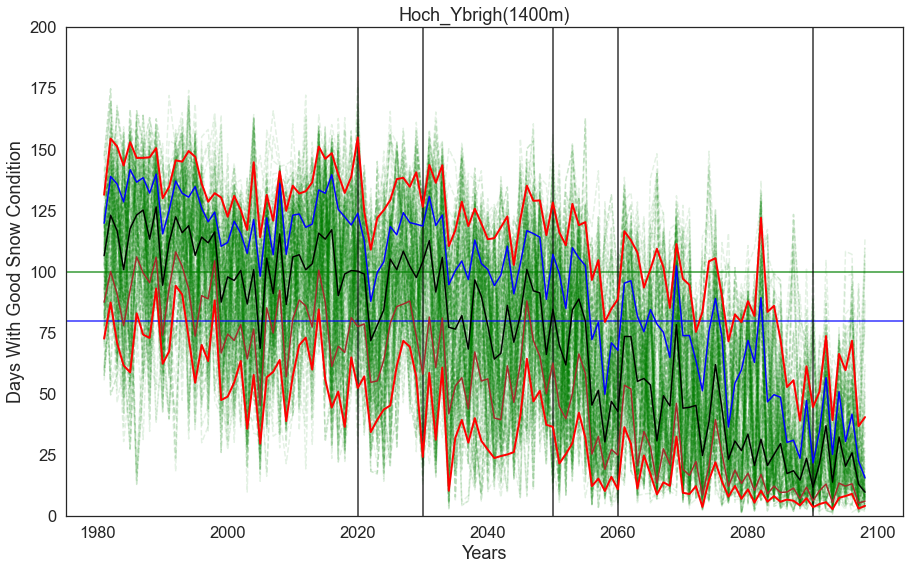

In [91]:
fig17, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig17.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

In [92]:
title_Figs = 'case5_Les Diablerets, elv_b 1820m, RCP2.6'

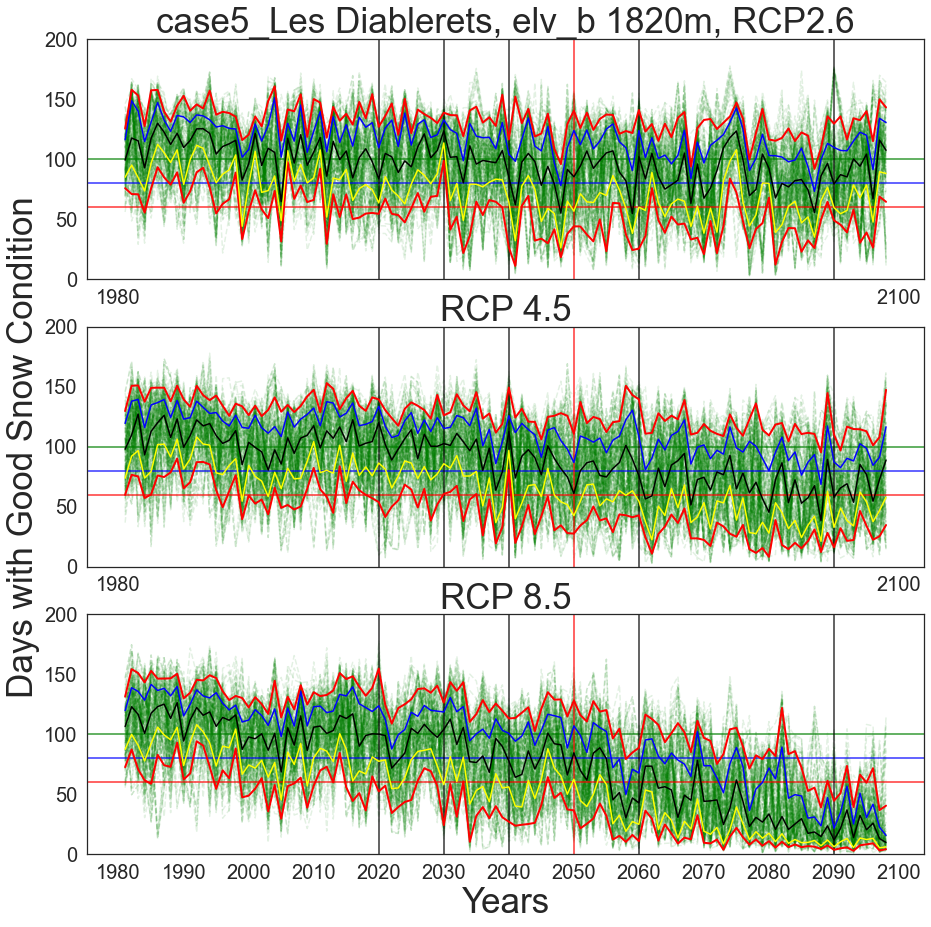

In [93]:
fig18, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)    

    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[0].axhline(y=60, color='red', alpha=0.8)

axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=60, color='red', alpha=0.8)

axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=60, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =200)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Good Snow Condition', fontsize=35)

axs[2].set_ylim(bottom=0, top =200)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)

fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.tiff'), format='tiff', dpi=150)

plt.show()

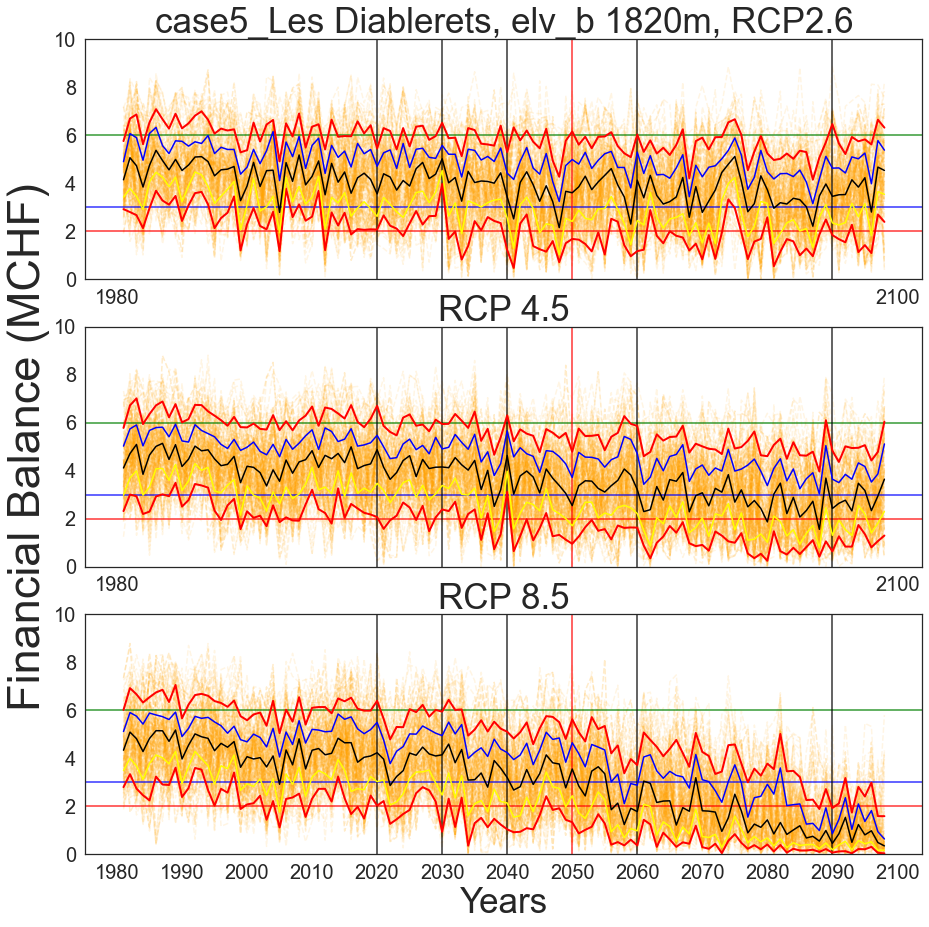

In [94]:
fig19, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_fin26), p_Step):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin45), p_Step):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin85), p_Step):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)    

axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=6, color='green', alpha=0.8)
axs[0].axhline(y=3, color='blue', alpha=0.8)
axs[0].axhline(y=2, color='red', alpha=0.8)

axs[1].axhline(y=6, color='green', alpha=0.8)
axs[1].axhline(y=3, color='blue', alpha=0.8)
axs[1].axhline(y=2, color='red', alpha=0.8)

axs[2].axhline(y=6, color='green', alpha=0.8)
axs[2].axhline(y=3, color='blue', alpha=0.8)
axs[2].axhline(y=2, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =10)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Balance (MCHF)', fontsize=45)

axs[2].set_ylim(bottom=0, top =10
               )
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)


fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)
fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.tiff'), format='tiff', dpi=150)


plt.show()

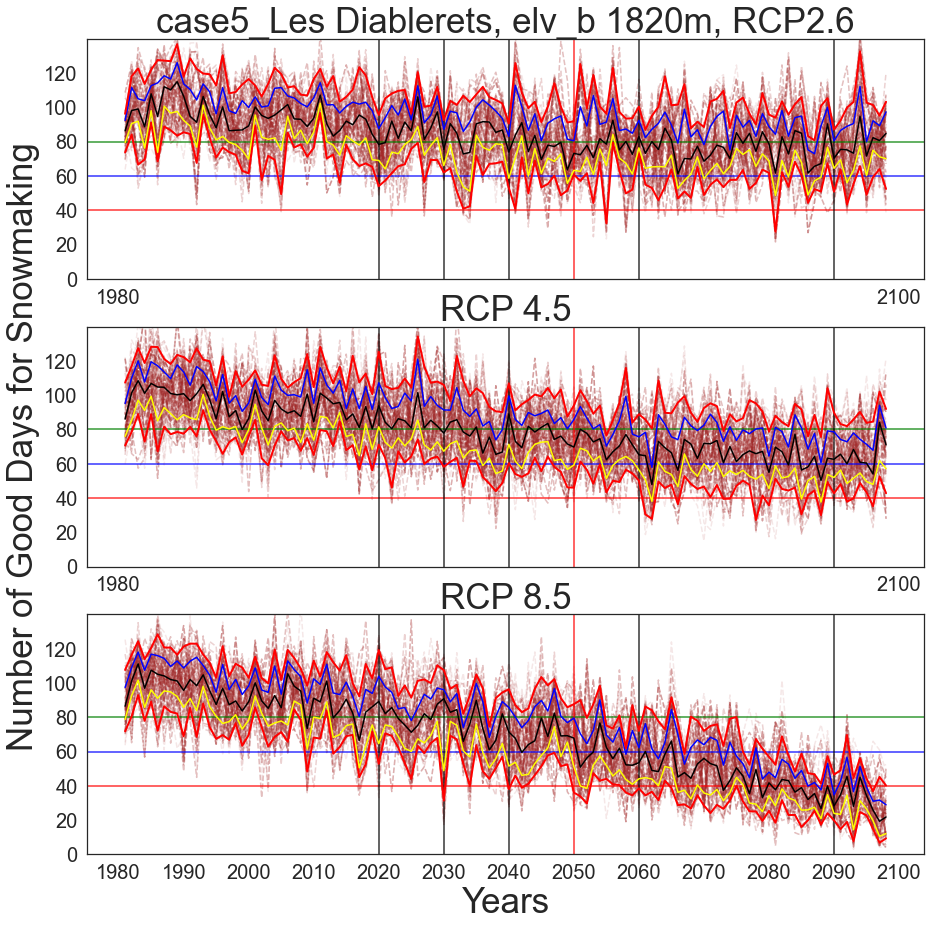

In [95]:
fig20, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), p_Step):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art45), p_Step):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art85), p_Step):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)    

    
    
    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=60, color='blue', alpha=0.8)
axs[0].axhline(y=40, color='red', alpha=0.8)

axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=60, color='blue', alpha=0.8)
axs[1].axhline(y=40, color='red', alpha=0.8)

axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=60, color='blue', alpha=0.8)
axs[2].axhline(y=40, color='red', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='red', linewidth = 2, alpha=1)



axs[0].set_ylim(bottom=0, top =140)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)

axs[1].set_ylim(bottom=0, top =140)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Number of Good Days for Snowmaking', fontsize=35)

axs[2].set_ylim(bottom=0, top =140)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)


fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)
fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.tiff'), format='tiff', dpi=150)


plt.show()

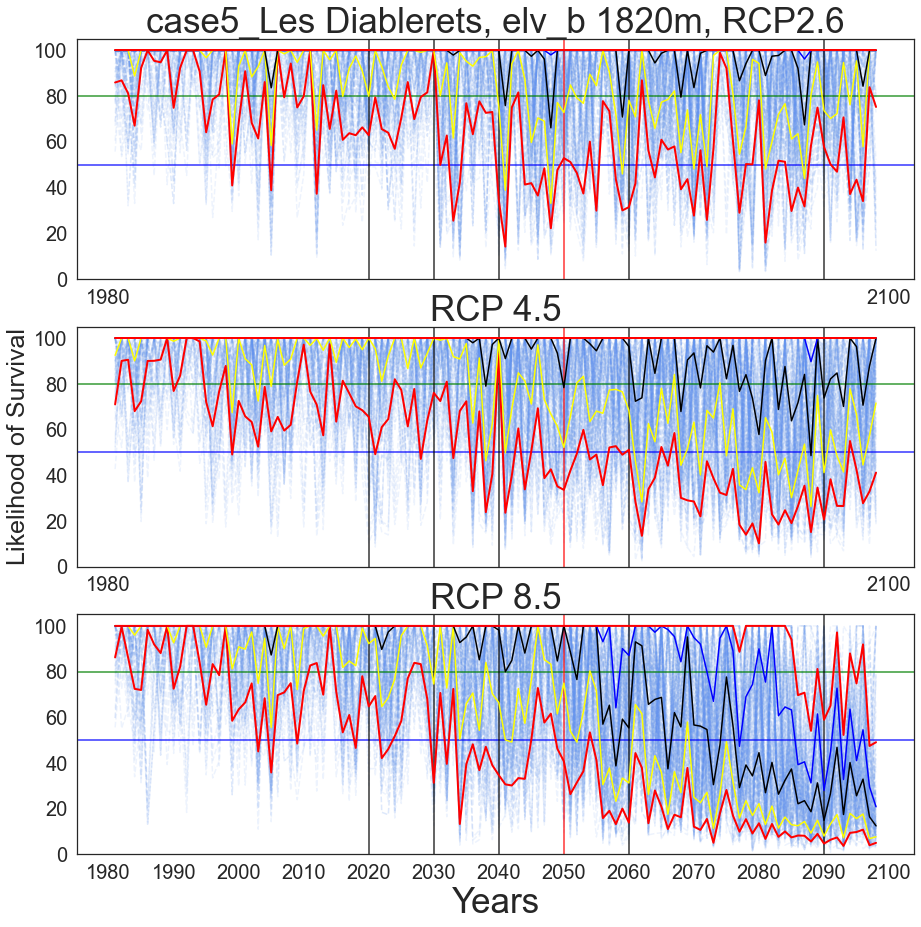

In [96]:
fig21, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), p_Step):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like45), p_Step):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like85), p_Step):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)    


axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)    
    

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Likelihood of Survival', fontsize=12)

axs[1].set_ylim(bottom=0, top =105)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival', fontsize=25)

axs[2].set_ylim(bottom=0, top =105)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)


axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Likelihood of Survival', fontsize=12)


fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)
fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.tiff'), format='tiff', dpi=150)


plt.show()

In [97]:
dfAllAverages.head()

,median26,median45,median85
0,98.897553,97.843776,106.543098
1,117.317966,109.660800,123.048508
2,115.023729,127.117250,116.709897
3,92.519180,93.152061,100.823180
4,117.145920,112.744613,117.665017


### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [98]:
title_Figs2 = 'Les Diablerets,1820m'

In [99]:
y_axis = np.arange(1981, 2100, step= 20)

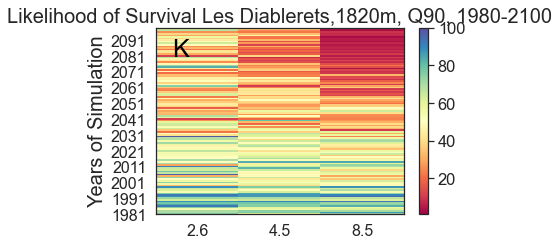

In [102]:
from matplotlib.ticker import FuncFormatter


fig22, (ax3) = plt.subplots(1, 1, figsize=(9,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='Spectral', vmin=1, vmax=100, offsets = 0.35)
cb3 = fig22.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


#ax3.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax3.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q90, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax3.text(0.2, 100, 'K', color = 'Black', fontsize=25)

fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)
fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.tiff'), format='tiff', dpi=300)


fig22.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

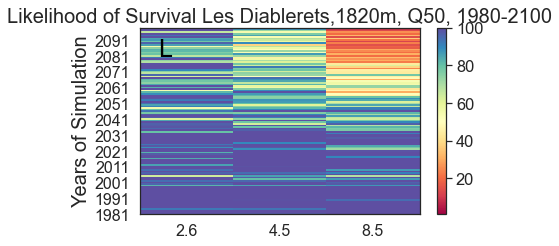

In [103]:
from matplotlib.ticker import FuncFormatter


fig23, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='Spectral' ,vmin=1, vmax=100, offsets = .35)
cb4 = fig23.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q50, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'L', color = 'Black', fontsize=25)


fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.svg'), format='svg', dpi=300)
fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.tiff'), format='tiff', dpi=300)
#fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.jpg'), format='jpg', dpi=300)


fig23.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

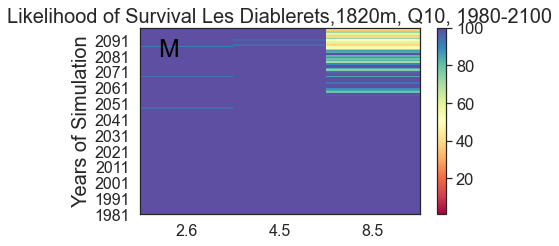

In [104]:
from matplotlib.ticker import FuncFormatter


fig24, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='Spectral' ,vmin=1, vmax=100)
cb4 = fig24.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q10, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'M', color = 'Black', fontsize=25)


fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.svg'), format='svg', dpi=300)
fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.tiff'), format='tiff', dpi=300)



fig24.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [105]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
(9000, 119, 2)


In [106]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [107]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [108]:
df26_all.head(7)
df26_all.to_csv(os.path.join(rootVisualization, 'df26_all.csv'), index = False)

In [109]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_sc_45_18'], dtype='<U47')

In [110]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [111]:
df45_all.head(7)
df45_all.to_csv(os.path.join(rootVisualization, 'df45_all.csv'), index = False)

In [112]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [113]:
df85_all.head(7)
df85_all.to_csv(os.path.join(rootVisualization, 'df85_all.csv'), index = False)

In [114]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

In [115]:
df26_all_fin = pd.DataFrame((matrix_fin26[0][1:,0:1]), columns=matrix_fin26[0,0,0:1])
for i in range(len(matrix_fin26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin26[i,0,1:])])
    df26_all_fin = pd.concat((df26_all_fin, b), axis = 1)

In [116]:
df26_all_fin.head(7)

,Season,sc_1_['Money_sc_26_8'],sc_2_['Money_sc_26_2'],sc_3_['Money_sc_26_8'],sc_4_['Money_sc_26_12'],sc_5_['Money_sc_26_2'],sc_6_['Money_sc_26_10'],sc_7_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_8_['Money_sc_26_5'],sc_9_['Money_sc_26_10'],sc_10_['Money_sc_26_4'],sc_11_['Money_sc_26_8'],sc_12_['Money_sc_26_6'],sc_13_['Money_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_14_['Money_sc_26_10'],sc_15_['Money_sc_26_2'],sc_16_['Money_sc_26_11'],sc_17_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_18_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_19_['Money_sc_26_7'],sc_20_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_21_['Money_sc_26_1'],sc_22_['Money_sc_26_10'],sc_23_['Money_sc_26_3'],sc_24_['Money_sc_26_8'],sc_25_['Money_sc_26_8'],sc_26_['Money_sc_26_4'],sc_27_['Money_sc_26_3'],sc_28_['Money_sc_26_10'],sc_29_['Money_sc_26_1'],sc_30_['Money_sc_26_8'],sc_31_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_32_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_33_['Money_sc_26_3'],...,sc_2937_['Money_sc_26_7'],sc_2938_['Money_sc_26_3'],sc_2939_['Money_sc_26_10'],sc_2940_['Money_sc_26_7'],sc_2941_['Money_sc_26_3'],sc_2942_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2943_['Money_sc_26_6'],sc_2944_['Money_sc_26_11'],sc_2945_['Money_sc_26_4'],sc_2946_['Money_sc_26_4'],sc_2947_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2948_['Money_sc_26_5'],sc_2949_['Money_sc_26_7'],sc_2950_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2951_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2952_['Money_sc_26_12'],sc_2953_['Money_sc_26_6'],sc_2954_['Money_sc_26_9'],sc_2955_['Money_sc_26_2'],sc_2956_['Money_sc_26_5'],sc_2957_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2958_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2959_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2960_['Money_sc_26_10'],sc_2961_['Money_sc_26_4'],sc_2962_['Money_sc_26_5'],sc_2963_['Money_sc_26_10'],sc_2964_['Money_sc_26_7'],sc_2965_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2966_['Money_sc_26_5'],sc_2967_['Money_sc_26_7'],sc_2968_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2969_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2970_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp']
0,1981-1982,3.2599999999999945,2.5000000000000018,2.4399999999999986,4.510000000000003,4.4600000000000035,4.600000000000003,4.530000000000004,3.2700000000000027,3.840000000000003,3.009999999999999,2.4399999999999986,3.8900000000000032,4.970000000000004,4.600000000000003,4.4600000000000035,5.280000000000004,3.2100000000000026,4.230000000000003,4.700000000000004,4.230000000000003,3.009999999999996,3.910000000000003,4.570000000000003,3.4199999999999937,3.5299999999999914,2.7499999999999973,5.240000000000004,3.7100000000000017,3.0899999999999976,2.419999999999999,4.0299999999999985,3.2100000000000026,4.150000000000004,...,6.529999999999985,6.129999999999987,5.999999999999988,5.639999999999989,7.169999999999983,5.009999999999991,4.669999999999994,4.769999999999998,4.919999999999994,3.610000000000003,4.379999999999997,5.739999999999995,5.629999999999989,4.959999999999991,6.329999999999987,6.419999999999986,4.669999999999994,5.47999999999999,6.509999999999986,5.07999999999999,6.559999999999985,3.4000000000000026,5.20999999999999,6.389999999999986,5.189999999999991,5.129999999999989,5.999999999999988,5.639999999999989,6.729999999999984,6.219999999999986,5.639999999999989,5.009999999999991,7.009999999999984,6.649999999999986
1,1982-1983,4.7500000000000036,3.580000000000002,3.8900000000000032,4.220000000000003,3.5599999999999996,3.0700000000000025,6.190000000000005,4.12,6.180000000000005,5.360000000000004,3.880000000000003,3.939999999999998,2.0000000000000013,3.0700000000000025,3.699999999999998,5.430000000000005,6.050000000000004,5.7900000000000045,3.960000000000003,5.7900000000000045,4.660000000000004,6.200000000000005,3.729999999999991,4.6300000000000034,4.7500000000000036,5.350000000000004,2.8899999999999957,6.180000000000005,4.660000000000004,3.8600000000000025,5.7900000000000045,6.050000000000004,3.359999999999994,.

In [117]:
df45_all_fin = pd.DataFrame((matrix_fin45[0][1:,0:1]), columns=matrix_fin45[0,0,0:1])
for i in range(len(matrix_fin45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin45[i,0,1:])])
    df45_all_fin = pd.concat((df45_all_fin, b), axis = 1)

In [118]:
df45_all_fin.head(7)

,Season,sc_1_['Money_sc_45_5'],sc_2_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_3_['Money_sc_45_18'],sc_4_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_5_['Money_sc_45_5'],sc_6_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_7_['Money_sc_45_5'],sc_8_['Money_sc_45_18'],sc_9_['Money_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_10_['Money_sc_45_22'],sc_11_['Money_sc_45_18'],sc_12_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_13_['Money_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_14_['Money_sc_45_2'],sc_15_['Money_sc_45_13'],sc_16_['Money_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_17_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_18_['Money_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_19_['Money_sc_45_24'],sc_20_['Money_sc_45_5'],sc_21_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_22_['Money_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_23_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_24_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_25_['Money_sc_45_10'],sc_26_['Money_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_27_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_28_['Money_sc_45_8'],sc_29_['Money_sc_45_8'],sc_30_['Money_sc_45_6'],sc_31_['Money_sc_45_12'],sc_32_['Money_sc_45_18'],sc_33_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],...,sc_3027_['Money_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_3028_['Money_sc_45_21'],sc_3029_['Money_sc_45_7'],sc_3030_['Money_sc_45_17'],sc_3031_['Money_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3032_['Money_sc_45_7'],sc_3033_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_3034_['Money_sc_45_13'],sc_3035_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_3036_['Money_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_3037_['Money_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_3038_['Money_sc_45_10'],sc_3039_['Money_sc_45_2'],sc_3040_['Money_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3041_['Money_sc_45_7'],sc_3042_['Money_sc_45_19'],sc_3043_['Money_sc_45_3'],sc_3044_['Money_sc_45_4'],sc_3045_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_3046_['Money_sc_45_3'],sc_3047_['Money_sc_45_18'],sc_3048_['Money_sc_45_11'],sc_3049_['Money_sc_45_11'],sc_3050_['Money_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3051_['Money_sc_45_4'],sc_3052_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_3053_['Money_sc_45_4'],sc_3054_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_3055_['Money_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_3056_['Money_sc_45_18'],sc_3057_['Money_sc_45_9'],sc_3058_['Money_sc_45_1'],sc_3059_['Money_sc_45_14'],sc_3060_['Money_sc_45_7']
0,1981-1982,4.010000000000001,3.46,3.399999999999999,2.7399999999999967,3.129999999999994,2.719999999999998,3.569999999999996,2.6300000000000003,2.0000000000000013,3.9700000000000006,3.3699999999999988,5.660000000000005,2.1500000000000017,2.7999999999999963,1.480000000000001,2.459999999999998,3.5699999999999963,4.310000000000003,4.390000000000002,3.719999999999992,4.319999999999999,2.1500000000000017,2.6899999999999973,4.839999999999999,3.1999999999999935,3.980000000000003,2.649999999999998,4.690000000000005,4.920000000000005,3.3000000000000025,3.779999999999997,2.699999999999998,2.369999999999999,...,3.86,5.4299999999999935,4.290000000000003,6.139999999999987,6.459999999999986,7.119999999999983,3.490000000000003,6.329999999999987,6.169999999999988,4.439999999999998,7.009999999999984,5.779999999999987,5.999999999999988,6.459999999999986,4.290000000000003,4.859999999999994,4.249999999999994,6.659999999999985,6.609999999999985,4.629999999999994,6.939999999999984,6.619999999999985,5.030000000000004,6.459999999999986,6.669999999999985,6.689999999999987,5.1699999999999955,4.329999999999994,5.979999999999987,5.250000000000004,5.099999999999991,3.859999999999994,4.379999999999998,7.119999999999983
1,1982-1983,6.720000000000005,3.9500000000000033,3.940000000000001,3.840000000000003,6.510000000000005,3.490000000000003,2.7799999999999976,3.3199999999999976,4.429999999999995,2.359999999999998,3.9200000000000004,6.710000000000005,3.850000000000003,5.630000000000004,2.7199999999999993,5.560000000000002,5.070000000000002,5.810000000000005,3.830000000000003,3.0099999999999953,2.769999999999

In [119]:
df85_all_fin = pd.DataFrame((matrix_fin85[0][1:,0:1]), columns=matrix_fin85[0,0,0:1])
for i in range(len(matrix_fin85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin85[i,0,1:])])
    df85_all_fin = pd.concat((df85_all_fin, b), axis = 1)

In [120]:
df85_all_fin.head(7)

,Season,sc_1_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_2_['Money_sc_85_1'],sc_3_['Money_sc_85_11'],sc_4_['Money_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_5_['Money_sc_85_29'],sc_6_['Money_sc_85_24'],sc_7_['Money_sc_85_13'],sc_8_['Money_sc_85_6'],sc_9_['Money_sc_85_31'],sc_10_['Money_sc_85_18'],sc_11_['Money_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_12_['Money_sc_85_29'],sc_13_['Money_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_14_['Money_sc_85_29'],sc_15_['Money_sc_85_1'],sc_16_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_17_['Money_sc_85_13'],sc_18_['Money_sc_85_14'],sc_19_['Money_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_20_['Money_sc_85_28'],sc_21_['Money_SMHI-RCA-NORESM-EUR44-RCP85-pcp'],sc_22_['Money_sc_85_8'],sc_23_['Money_SMHI-RCA-MPIESM-EUR44-RCP85-pcp'],sc_24_['Money_SMHI-RCA-MPIESM-EUR44-RCP85-pcp'],sc_25_['Money_sc_85_20'],sc_26_['Money_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_27_['Money_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_28_['Money_sc_85_28'],sc_29_['Money_sc_85_27'],sc_30_['Money_sc_85_27'],sc_31_['Money_sc_85_2'],sc_32_['Money_sc_85_21'],sc_33_['Money_sc_85_13'],...,sc_2937_['Money_sc_85_15'],sc_2938_['Money_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_2939_['Money_sc_85_2'],sc_2940_['Money_sc_85_15'],sc_2941_['Money_sc_85_1'],sc_2942_['Money_sc_85_9'],sc_2943_['Money_sc_85_9'],sc_2944_['Money_sc_85_6'],sc_2945_['Money_sc_85_5'],sc_2946_['Money_sc_85_15'],sc_2947_['Money_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_2948_['Money_sc_85_21'],sc_2949_['Money_sc_85_7'],sc_2950_['Money_sc_85_8'],sc_2951_['Money_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_2952_['Money_sc_85_18'],sc_2953_['Money_sc_85_2'],sc_2954_['Money_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_2955_['Money_sc_85_27'],sc_2956_['Money_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_2957_['Money_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_2958_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_2959_['Money_sc_85_2'],sc_2960_['Money_sc_85_3'],sc_2961_['Money_sc_85_23'],sc_2962_['Money_sc_85_13'],sc_2963_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_2964_['Money_sc_85_11'],sc_2965_['Money_sc_85_2'],sc_2966_['Money_sc_85_17'],sc_2967_['Money_SMHI-RCA-IPSL-EUR11-RCP85-pcp'],sc_2968_['Money_sc_85_18'],sc_2969_['Money_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_2970_['Money_sc_85_26']
0,1981-1982,3.1399999999999926,3.490000000000003,4.2500000000000036,4.200000000000003,2.839999999999996,2.32,4.580000000000004,2.640000000000002,3.830000000000003,4.680000000000003,4.980000000000003,3.0500000000000016,4.250000000000005,3.3300000000000027,3.490000000000003,3.969999999999998,2.5399999999999987,3.3799999999999937,4.610000000000006,3.1400000000000023,4.970000000000004,2.0700000000000016,2.060000000000001,2.829999999999997,4.270000000000001,4.330000000000004,5.370000000000004,3.1999999999999966,4.100000000000001,4.6300000000000034,4.640000000000003,3.3399999999999994,5.210000000000004,...,5.699999999999988,6.749999999999985,5.9599999999999875,6.179999999999992,5.499999999999989,6.299999999999986,5.679999999999989,4.109999999999995,4.589999999999998,6.449999999999986,7.009999999999984,3.9700000000000006,7.259999999999984,6.609999999999985,4.599999999999993,7.899999999999981,6.959999999999984,7.369999999999982,6.359999999999986,5.47999999999999,6.529999999999986,5.559999999999985,5.9599999999999875,5.999999999999988,6.119999999999987,5.340000000000004,5.489999999999991,6.2999999999999865,6.959999999999984,6.269999999999988,5.9599999999999875,6.999999999999984,7.419999999999982,6.2499999999999885
1,1982-1983,5.3700000000000045,4.110000000000002,6.230000000000005,5.700000000000005,3.7699999999999934,3.4899999999999944,4.740000000000004,3.279999999999994,4.219999999999998,5.070000000000005,6.550000000000005,4.32,6.150000000000005,4.5,4.1700000000000035,5.630000000000004,4.659999999999995,4.780000000000004,3.560000000000002,5.120000000000004,1.7500000000000013,2.889999999999996,3.870000000000003,4.2100000000000035,2.6699999999999977,5.810000000000005,6.710000000000005,5.430000000000004,3.710000000000002,4.1700000000000035

In [121]:
df26_all_Art = pd.DataFrame((matrix_Art26[0][1:,0:1]), columns=matrix_Art26[0,0,0:1])
for i in range(len(matrix_Art26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art26[i,0,1:])])
    df26_all_Art = pd.concat((df26_all_Art, b), axis = 1)

In [122]:
df26_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_26_8'],sc_2_['ArtSnowPossibility_sc_26_2'],sc_3_['ArtSnowPossibility_sc_26_8'],sc_4_['ArtSnowPossibility_sc_26_12'],sc_5_['ArtSnowPossibility_sc_26_2'],sc_6_['ArtSnowPossibility_sc_26_10'],sc_7_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_8_['ArtSnowPossibility_sc_26_5'],sc_9_['ArtSnowPossibility_sc_26_10'],sc_10_['ArtSnowPossibility_sc_26_4'],sc_11_['ArtSnowPossibility_sc_26_8'],sc_12_['ArtSnowPossibility_sc_26_6'],sc_13_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_14_['ArtSnowPossibility_sc_26_10'],sc_15_['ArtSnowPossibility_sc_26_2'],sc_16_['ArtSnowPossibility_sc_26_11'],sc_17_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_18_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_19_['ArtSnowPossibility_sc_26_7'],sc_20_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_21_['ArtSnowPossibility_sc_26_1'],sc_22_['ArtSnowPossibility_sc_26_10'],sc_23_['ArtSnowPossibility_sc_26_3'],sc_24_['ArtSnowPossibility_sc_26_8'],sc_25_['ArtSnowPossibility_sc_26_8'],sc_26_['ArtSnowPossibility_sc_26_4'],sc_27_['ArtSnowPossibility_sc_26_3'],sc_28_['ArtSnowPossibility_sc_26_10'],sc_29_['ArtSnowPossibility_sc_26_1'],sc_30_['ArtSnowPossibility_sc_26_8'],sc_31_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_32_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_33_['ArtSnowPossibility_sc_26_3'],...,sc_2937_['ArtSnowPossibility_sc_26_7'],sc_2938_['ArtSnowPossibility_sc_26_3'],sc_2939_['ArtSnowPossibility_sc_26_10'],sc_2940_['ArtSnowPossibility_sc_26_7'],sc_2941_['ArtSnowPossibility_sc_26_3'],sc_2942_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2943_['ArtSnowPossibility_sc_26_6'],sc_2944_['ArtSnowPossibility_sc_26_11'],sc_2945_['ArtSnowPossibility_sc_26_4'],sc_2946_['ArtSnowPossibility_sc_26_4'],sc_2947_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2948_['ArtSnowPossibility_sc_26_5'],sc_2949_['ArtSnowPossibility_sc_26_7'],sc_2950_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2951_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2952_['ArtSnowPossibility_sc_26_12'],sc_2953_['ArtSnowPossibility_sc_26_6'],sc_2954_['ArtSnowPossibility_sc_26_9'],sc_2955_['ArtSnowPossibility_sc_26_2'],sc_2956_['ArtSnowPossibility_sc_26_5'],sc_2957_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2958_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2959_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2960_['ArtSnowPossibility_sc_26_10'],sc_2961_['ArtSnowPossibility_sc_26_4'],sc_2962_['ArtSnowPossibility_sc_26_5'],sc_2963_['ArtSnowPossibility_sc_26_10'],sc_2964_['ArtSnowPossibility_sc_26_7'],sc_2965_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2966_['ArtSnowPossibility_sc_26_5'],sc_2967_['ArtSnowPossibility_sc_26_7'],sc_2968_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2969_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2970_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp']
0,1981-1982,90.05000000000001,79.47999999999999,63.76999999999999,80.39,73.86000000000003,81.83000000000001,93.18999999999998,108.68,86.45,98.50000000000003,72.94,85.19000000000003,91.96,80.46000000000001,78.52999999999994,71.74,88.34000000000002,80.44999999999999,78.87,96.30000000000001,86.41000000000001,84.71999999999998,72.87,92.53,85.13,98.78999999999999,95.06,85.27999999999997,94.84999999999998,69.25,82.74000000000001,79.01000000000002,84.21000000000001,...,78.87,72.87,89.72000000000003,95.42,87.43999999999998,79.41,96.30000000000001,77.16,69.71999999999998,93.84000000000002,73.75000000000001,74.61000000000001,94.57000000000001,87.62000000000002,78.91999999999999,82.64,91.50999999999996,92.42,85.69999999999997,105.96,91.97,88.36,86.36,77.41000000000001,105.67000000000002,82.71999999999997,87.03999999999996,95.69000000000001,80.81,79.99000000000001,92.36,91.25999999999998,98.5,86.66
1,1982-1983,85.37999999999997,99.04,87.45000000000002,93.57999999999996,

In [123]:
df45_all_Art = pd.DataFrame((matrix_Art45[0][1:,0:1]), columns=matrix_Art45[0,0,0:1])
for i in range(len(matrix_Art45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art45[i,0,1:])])
    df45_all_Art = pd.concat((df45_all_Art, b), axis = 1)

In [124]:
df45_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_45_5'],sc_2_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_3_['ArtSnowPossibility_sc_45_18'],sc_4_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_5_['ArtSnowPossibility_sc_45_5'],sc_6_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_7_['ArtSnowPossibility_sc_45_5'],sc_8_['ArtSnowPossibility_sc_45_18'],sc_9_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_10_['ArtSnowPossibility_sc_45_22'],sc_11_['ArtSnowPossibility_sc_45_18'],sc_12_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_13_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_14_['ArtSnowPossibility_sc_45_2'],sc_15_['ArtSnowPossibility_sc_45_13'],sc_16_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_17_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_18_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_19_['ArtSnowPossibility_sc_45_24'],sc_20_['ArtSnowPossibility_sc_45_5'],sc_21_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_22_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_23_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_24_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_25_['ArtSnowPossibility_sc_45_10'],sc_26_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_27_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_28_['ArtSnowPossibility_sc_45_8'],sc_29_['ArtSnowPossibility_sc_45_8'],sc_30_['ArtSnowPossibility_sc_45_6'],sc_31_['ArtSnowPossibility_sc_45_12'],sc_32_['ArtSnowPossibility_sc_45_18'],sc_33_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],...,sc_3027_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_3028_['ArtSnowPossibility_sc_45_21'],sc_3029_['ArtSnowPossibility_sc_45_7'],sc_3030_['ArtSnowPossibility_sc_45_17'],sc_3031_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3032_['ArtSnowPossibility_sc_45_7'],sc_3033_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_3034_['ArtSnowPossibility_sc_45_13'],sc_3035_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_3036_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_3037_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_3038_['ArtSnowPossibility_sc_45_10'],sc_3039_['ArtSnowPossibility_sc_45_2'],sc_3040_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3041_['ArtSnowPossibility_sc_45_7'],sc_3042_['ArtSnowPossibility_sc_45_19'],sc_3043_['ArtSnowPossibility_sc_45_3'],sc_3044_['ArtSnowPossibility_sc_45_4'],sc_3045_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_3046_['ArtSnowPossibility_sc_45_3'],sc_3047_['ArtSnowPossibility_sc_45_18'],sc_3048_['ArtSnowPossibility_sc_45_11'],sc_3049_['ArtSnowPossibility_sc_45_11'],sc_3050_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3051_['ArtSnowPossibility_sc_45_4'],sc_3052_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_3053_['ArtSnowPossibility_sc_45_4'],sc_3054_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_3055_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_3056_['ArtSnowPossibility_sc_45_18'],sc_3057_['ArtSnowPossibility_sc_45_9'],sc_3058_['ArtSnowPossibility_sc_45_1'],sc_3059_['ArtSnowPossibility_sc_45_14'],sc_3060_['ArtSnowPossibility_sc_45_7']
0,1981-1982,85.66000000000001,84.99,74.02,86.16,85.66000000000001,84.99,82.92,74.02,76.81,89.13999999999999,68.58999999999997,65.17000000000002,75.97,86.02000000000001,72.24000000000001,91.68999999999998,90.36000000000001,96.25999999999999,90.03,72.11,121.91000000000001,77.58999999999997,80.18999999999998,121.22,101.99000000000001,98.48000000000002,86.89999999999999,78.64999999999999,81.80999999999997,113.08000000000001,92.40999999999998,75.92000000000002,78.27000000000001,...,91.68999999999998,70.69,77.5,95.48,93.49999999999999,104.46000000000002,74.39,75.6,88.72999999999999,95.08,89.42999999999996,104.02999999999997,102.39,95.15999999999995,67.22,116.84,71.17000000000002,75.21000000000002,83.04,73.60999999999999,113.450

In [125]:
df85_all_Art = pd.DataFrame((matrix_Art85[0][1:,0:1]), columns=matrix_Art85[0,0,0:1])
for i in range(len(matrix_Art85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art85[i,0,1:])])
    df85_all_Art = pd.concat((df85_all_Art, b), axis = 1)

In [126]:
df85_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_2_['ArtSnowPossibility_sc_85_1'],sc_3_['ArtSnowPossibility_sc_85_11'],sc_4_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_5_['ArtSnowPossibility_sc_85_29'],sc_6_['ArtSnowPossibility_sc_85_24'],sc_7_['ArtSnowPossibility_sc_85_13'],sc_8_['ArtSnowPossibility_sc_85_6'],sc_9_['ArtSnowPossibility_sc_85_31'],sc_10_['ArtSnowPossibility_sc_85_18'],sc_11_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_12_['ArtSnowPossibility_sc_85_29'],sc_13_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_14_['ArtSnowPossibility_sc_85_29'],sc_15_['ArtSnowPossibility_sc_85_1'],sc_16_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_17_['ArtSnowPossibility_sc_85_13'],sc_18_['ArtSnowPossibility_sc_85_14'],sc_19_['ArtSnowPossibility_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_20_['ArtSnowPossibility_sc_85_28'],sc_21_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP85-pcp'],sc_22_['ArtSnowPossibility_sc_85_8'],sc_23_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP85-pcp'],sc_24_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP85-pcp'],sc_25_['ArtSnowPossibility_sc_85_20'],sc_26_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_27_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_28_['ArtSnowPossibility_sc_85_28'],sc_29_['ArtSnowPossibility_sc_85_27'],sc_30_['ArtSnowPossibility_sc_85_27'],sc_31_['ArtSnowPossibility_sc_85_2'],sc_32_['ArtSnowPossibility_sc_85_21'],sc_33_['ArtSnowPossibility_sc_85_13'],...,sc_2937_['ArtSnowPossibility_sc_85_15'],sc_2938_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_2939_['ArtSnowPossibility_sc_85_2'],sc_2940_['ArtSnowPossibility_sc_85_15'],sc_2941_['ArtSnowPossibility_sc_85_1'],sc_2942_['ArtSnowPossibility_sc_85_9'],sc_2943_['ArtSnowPossibility_sc_85_9'],sc_2944_['ArtSnowPossibility_sc_85_6'],sc_2945_['ArtSnowPossibility_sc_85_5'],sc_2946_['ArtSnowPossibility_sc_85_15'],sc_2947_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_2948_['ArtSnowPossibility_sc_85_21'],sc_2949_['ArtSnowPossibility_sc_85_7'],sc_2950_['ArtSnowPossibility_sc_85_8'],sc_2951_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_2952_['ArtSnowPossibility_sc_85_18'],sc_2953_['ArtSnowPossibility_sc_85_2'],sc_2954_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_2955_['ArtSnowPossibility_sc_85_27'],sc_2956_['ArtSnowPossibility_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_2957_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_2958_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_2959_['ArtSnowPossibility_sc_85_2'],sc_2960_['ArtSnowPossibility_sc_85_3'],sc_2961_['ArtSnowPossibility_sc_85_23'],sc_2962_['ArtSnowPossibility_sc_85_13'],sc_2963_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_2964_['ArtSnowPossibility_sc_85_11'],sc_2965_['ArtSnowPossibility_sc_85_2'],sc_2966_['ArtSnowPossibility_sc_85_17'],sc_2967_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP85-pcp'],sc_2968_['ArtSnowPossibility_sc_85_18'],sc_2969_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_2970_['ArtSnowPossibility_sc_85_26']
0,1981-1982,94.65999999999998,108.94000000000001,84.37,79.09000000000003,69.41,97.03999999999998,104.27000000000001,72.88000000000001,125.32999999999998,97.19000000000003,76.64000000000001,83.60000000000001,78.57000000000001,87.46,107.62999999999997,90.95999999999998,87.42999999999998,79.16999999999997,86.80999999999999,81.47999999999999,82.61000000000001,78.76999999999998,71.39,72.59000000000002,86.59,89.68,70.28000000000002,75.33000000000003,63.660000000000004,71.79000000000002,105.91,92.09000000000002,105.78000000000002,...,77.27,100.13999999999997,96.47999999999999,84.02000000000001,112.06000000000002,75.48,92.01,71.94000000000001,84.29000000000005,79.13000000000002,88.61999999999999,92.09000000000002,84.86,99.98999999999998,73.36000000000001,99.44000000000004,108.36000000000001,85.92999999999999,71.61000000000003,100.54,97.38000000000002,85.50000000000001,101.479999999

### Survival Map CH2018 RCP2.6

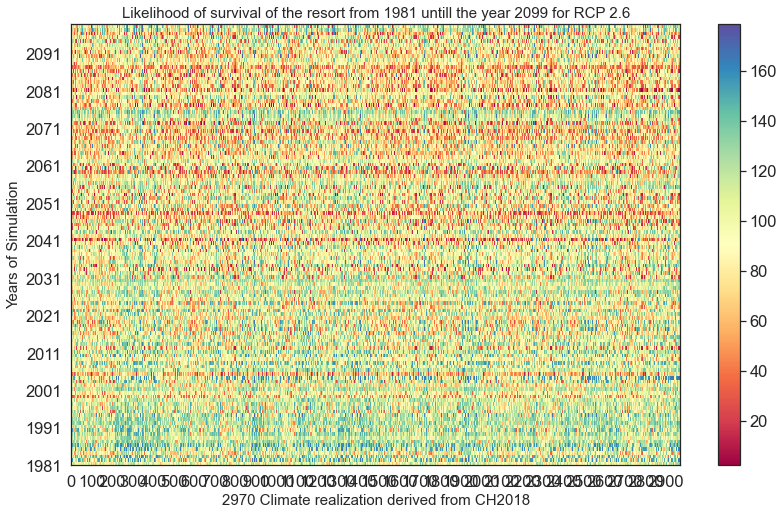

In [127]:
fig25, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig25.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6), fontsize=15)

fig25.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

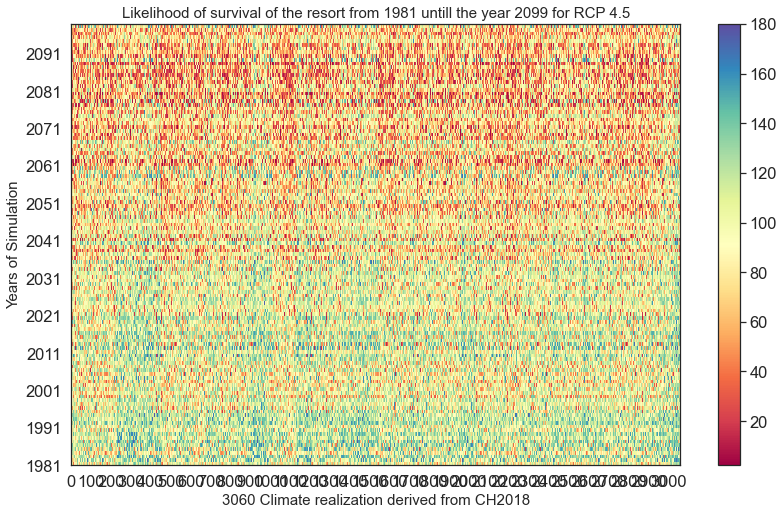

In [128]:
fig26, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig26.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5), fontsize=15)

fig26.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

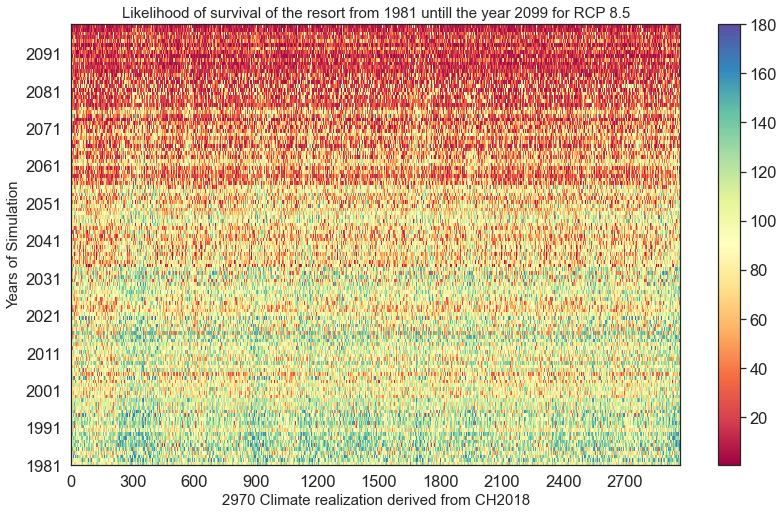

In [129]:
fig27, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')

cb3 = fig27.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5), fontsize=15)

fig27.tight_layout()
plt.show()

## 3 years of not having good snow days in 10 years

### version 1: fixed threshold

In [130]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

### version 2: dynamic threshold

In [131]:
def tipping_points_freq2(df2, threshold):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df2Columns= df2.columns
    
    scenarios_length= len(df2Columns)
    simulations_Length = len(df2[df2Columns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df2[df2Columns[i]].iloc[j]) < threshold[i-1] -10:
                m += 1
                mm += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                mm = 0
                continue    
                #break
    return tipping_freq

### version 3: Time rolling and policy selection added

In [132]:
def tipping_points_freq3(df3, threshold, beginningYear, endYear, policy, tippingpoint_threshold, scenario):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df3Columns= df3.columns
    
    scenarios_length= len(df3Columns)
    #simulations_Length = len(df3[df3Columns[1]])
    simulations_Length = endYear - beginningYear + 1
    statring_year = beginningYear - 1981 
    tipping_freq = np.zeros(scenarios_length)
    goodPolicy = []
    goodScenario = []
    goodTippingPoint = []
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 + statring_year, statring_year + simulations_Length + 1, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            mm += 1
            if float(df3[df3Columns[i]].iloc[j]) < threshold[i-1]:
                m += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                if mm > 10:
                    m = 0
                    mm = 0
                #continue    
                #break
                
        if tipping_freq[i] < tippingpoint_threshold:
            goodPolicy.append(policy[i-1])
            goodScenario.append(scenario[i-1])
            goodTippingPoint.append(tipping_freq[i])
        else:
            continue
            
    return tipping_freq, goodTippingPoint, goodPolicy, goodScenario

In [133]:
df26_all.shape

(118, 2971)

In [134]:
filt_S26 = (df_final_ema['xRCP'] == 1)
thresholds_26 = df_final_ema.loc[filt_S26, 'xGoodDays']
thresholds_26_m = thresholds_26.to_numpy()
thresholds_26_pol = df_final_ema.loc[filt_S26, 'policy']
thresholds_26_pol_m = thresholds_26_pol.to_numpy()
thresholds_26_sce = df_final_ema.loc[filt_S26, 'scenario']
thresholds_26_sce_m = thresholds_26_sce.to_numpy()

filt_S45 = (df_final_ema['xRCP'] == 2)
thresholds_45 = df_final_ema.loc[filt_S45, 'xGoodDays']
thresholds_45_m = thresholds_45.to_numpy()
thresholds_45_pol = df_final_ema.loc[filt_S45, 'policy']
thresholds_45_pol_m = thresholds_45_pol.to_numpy()
thresholds_45_sce = df_final_ema.loc[filt_S45, 'scenario']
thresholds_45_sce_m = thresholds_45_sce.to_numpy()

filt_S85 = (df_final_ema['xRCP'] == 3)
thresholds_85 = df_final_ema.loc[filt_S85, 'xGoodDays']
thresholds_85_m = thresholds_85.to_numpy()
thresholds_85_pol = df_final_ema.loc[filt_S85, 'policy']
thresholds_85_pol_m = thresholds_85_pol.to_numpy()
thresholds_85_sce = df_final_ema.loc[filt_S85, 'scenario']
thresholds_85_sce_m = thresholds_85_sce.to_numpy()


In [135]:
type(df26_all)

pandas.core.frame.DataFrame

In [136]:
thresholds_85_sce_m

array([  2,   5,   9, ..., 188, 191, 197], dtype=int64)

In [137]:
thresholds_45_sce_m

array([  0,   1,   4, ..., 193, 195, 196], dtype=int64)

In [138]:
df26_allColumns = df26_all.columns

In [139]:
df26_all[df26_allColumns[1]].iloc[0]

'84.53514285714293'

In [140]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_26_8'],sc_2_['isOverSnow_sc_26_2'],sc_3_['isOverSnow_sc_26_8'],sc_4_['isOverSnow_sc_26_12'],sc_5_['isOverSnow_sc_26_2'],sc_6_['isOverSnow_sc_26_10'],sc_7_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_8_['isOverSnow_sc_26_5'],sc_9_['isOverSnow_sc_26_10'],sc_10_['isOverSnow_sc_26_4'],sc_11_['isOverSnow_sc_26_8'],sc_12_['isOverSnow_sc_26_6'],sc_13_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_14_['isOverSnow_sc_26_10'],sc_15_['isOverSnow_sc_26_2'],sc_16_['isOverSnow_sc_26_11'],sc_17_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_18_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_19_['isOverSnow_sc_26_7'],sc_20_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_21_['isOverSnow_sc_26_1'],sc_22_['isOverSnow_sc_26_10'],sc_23_['isOverSnow_sc_26_3'],sc_24_['isOverSnow_sc_26_8'],sc_25_['isOverSnow_sc_26_8'],sc_26_['isOverSnow_sc_26_4'],sc_27_['isOverSnow_sc_26_3'],sc_28_['isOverSnow_sc_26_10'],sc_29_['isOverSnow_sc_26_1'],sc_30_['isOverSnow_sc_26_8'],sc_31_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_32_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_33_['isOverSnow_sc_26_3'],...,sc_2937_['isOverSnow_sc_26_7'],sc_2938_['isOverSnow_sc_26_3'],sc_2939_['isOverSnow_sc_26_10'],sc_2940_['isOverSnow_sc_26_7'],sc_2941_['isOverSnow_sc_26_3'],sc_2942_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2943_['isOverSnow_sc_26_6'],sc_2944_['isOverSnow_sc_26_11'],sc_2945_['isOverSnow_sc_26_4'],sc_2946_['isOverSnow_sc_26_4'],sc_2947_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2948_['isOverSnow_sc_26_5'],sc_2949_['isOverSnow_sc_26_7'],sc_2950_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2951_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2952_['isOverSnow_sc_26_12'],sc_2953_['isOverSnow_sc_26_6'],sc_2954_['isOverSnow_sc_26_9'],sc_2955_['isOverSnow_sc_26_2'],sc_2956_['isOverSnow_sc_26_5'],sc_2957_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2958_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2959_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2960_['isOverSnow_sc_26_10'],sc_2961_['isOverSnow_sc_26_4'],sc_2962_['isOverSnow_sc_26_5'],sc_2963_['isOverSnow_sc_26_10'],sc_2964_['isOverSnow_sc_26_7'],sc_2965_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2966_['isOverSnow_sc_26_5'],sc_2967_['isOverSnow_sc_26_7'],sc_2968_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2969_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2970_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp']
0,1981-1982,84.53514285714293,61.66785714285718,66.27628571428578,117.34514285714286,114.06882142857144,118.73107142857144,112.66185714285713,83.83699999999999,99.703,80.92607142857139,64.70685714285716,96.66775000000003,124.13553571428572,118.72753571428572,115.04417857142857,134.30242857142855,81.02860714285717,109.08228571428572,116.85232000000005,109.08153571428572,81.08142857142862,100.78328571428587,112.19452000000001,85.95996428571436,88.79899999999998,74.54675000000003,132.09742857142857,94.5861785714287,82.02260714285714,64.43810714285719,106.45557142857143,81.17810714285716,105.62289285714276,...,128.12805,121.43239999999997,118.16944999999998,111.3926,143.5937,98.23120000000006,90.46620000000003,91.80574999999997,97.63519999999998,88.97587999999996,83.4692500000001,112.83574999999995,111.0117,96.55960000000002,122.11754999999997,126.5163,90.46620000000003,108.37695,128.0418,100.38544999999999,128.91205000000002,79.40596000000002,103.73925,126.7889,100.56004999999996,97.57634999999998,118.11485000000002,111.32965,130.8994,125.17190000000001,111.37665,97.87225000000004,139.55285,128.11130000000003
1,1982-1983,120.22157142857145,96.18428571428574,102.8923571428572,106.74646428571431,92.88124999999998,83.33667857142856,156.4765357142857,106.71071428571429,155.165,134.10417857142858,102.47342857142866,106.20407142857141,51.58682142857147,82.9756785714286,97.56607142857142,139.48164285714287,155.2820357142857,144.77382142857144,95.5766,145.20996428571428,118.78814285714284,155.6

In [141]:
thresholds_45_sce_m.shape

(3060,)

In [142]:
#print(thresholds_85.shape)
print(type(thresholds_85_m))
print(thresholds_85_m[1])
print(thresholds_85_pol_m[20])
print(thresholds_85_sce_m[20])

<class 'numpy.ndarray'>
100.0
0
68


In [143]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [144]:
T1RCP26_m = tipping_points_freq2(df26_all, thresholds_26_m)
T1RCP45_m = tipping_points_freq2(df45_all, thresholds_45_m)
T1RCP85_m = tipping_points_freq2(df85_all, thresholds_85_m)

In [145]:
T1RCP26_m_3 , tipping26_3, scenario26_3, policy26_3= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2097, thresholds_26_pol_m, 10, thresholds_26_sce_m)
T1RCP45_m_3 , tipping45_3, scenario45_3, policy45_3= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2097, thresholds_45_pol_m, 10, thresholds_45_sce_m)
T1RCP85_m_3 , tipping85_3, scenario85_3, policy85_3= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2097, thresholds_85_pol_m, 10, thresholds_85_sce_m)

In [146]:
print(len( policy26_3))
print(len( policy45_3))
print(len( policy85_3))

1504
1101
185


In [147]:
print(len(scenario26_3))
print(len(scenario45_3))
print(len(scenario85_3))

1504
1101
185


In [148]:
print(len(tipping26_3))
print(len(tipping45_3))
print(len(tipping85_3))

1504
1101
185


In [149]:
print(len(T1RCP26_m_3))
print(len(T1RCP45_m_3))
print(len(T1RCP85_m_3))

2971
3061
2971


In [150]:
print(len(T1RCP26[1:]))
print(len(T1RCP45[1:]))
print(len(T1RCP85[1:]))

2970
3060
2970


In [151]:
type(T1RCP85)

numpy.ndarray

In [152]:
T1RCP85.shape

(2971,)

In [153]:
print(type(T1RCP85_m_3))
print(type(scenario85_3))
print(type(policy85_3))

<class 'numpy.ndarray'>
<class 'list'>
<class 'list'>


In [154]:
tipping26_3_df = pd.DataFrame(tipping26_3, columns =['tippingPoint26'])
tipping45_3_df = pd.DataFrame(tipping45_3, columns =['tippingPoint45'])
tipping85_3_df = pd.DataFrame(tipping85_3, columns =['tippingPoint85'])

scenario26_m_3 = pd.DataFrame(scenario26_3, columns =['Scenario26'])
scenario45_m_3 = pd.DataFrame(scenario45_3, columns =['Scenario45'])
scenario85_m_3 = pd.DataFrame(scenario85_3, columns =['Scenario85'])

policy26_m_3 = pd.DataFrame(policy26_3, columns =['Policy26'])
policy45_m_3 = pd.DataFrame(policy45_3, columns =['Policy45'])
policy85_m_3 = pd.DataFrame(policy85_3, columns =['Policy85'])

In [155]:
df_final_tipping_point = pd.concat((tipping26_3_df, scenario26_m_3, policy26_m_3, 
                                    tipping45_3_df, scenario45_m_3, policy45_m_3,
                                    tipping85_3_df, scenario85_m_3, policy85_m_3), axis = 1)

df_final_tipping_point.head(38)

,tippingPoint26,Scenario26,Policy26,tippingPoint45,Scenario45,Policy45,tippingPoint85,Scenario85,Policy85
0,8.0,0,87,5.0,1.0,0.0,9.0,9.0,52.0
1,4.0,1,7,3.0,1.0,4.0,9.0,9.0,118.0
2,2.0,1,19,9.0,1.0,10.0,9.0,9.0,159.0
3,2.0,1,63,9.0,1.0,73.0,9.0,9.0,182.0
4,8.0,1,75,6.0,1.0,76.0,8.0,12.0,52.0
5,2.0,1,116,4.0,1.0,99.0,9.0,12.0,124.0
6,9.0,1,121,9.0,1.0,103.0,9.0,12.0,137.0
7,3.0,1,128,6.0,1.0,161.0,9.0,12.0,179.0
8,4.0,1,140,7.0,1.0,190.0,8.0,15.0,2.0
9,7.0,1,147,9.0,2.0,1.0,9.0,15.0,9.0


### Specify the number of runs
for instance : number_Simulations = 9000

In [156]:
number_Simulations = 9000
x_axis = np.arange(1,number_Simulations + 2)

In [157]:
print("The lengthe of Y is: {}".format(len(T1RCP26[1:])))
print("The lengthe of X is: {}".format(len(matrix_GoodDays26) + 1 -1))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP45[1:])))
print("The lengthe of X is: {}".format((len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1) -(len(matrix_GoodDays26) + 1)))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP85[1:])))
print("The lengthe of X is: {}".format(number_Simulations+1 - (len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1)))

The lengthe of Y is: 2970
The lengthe of X is: 2970
***
The lengthe of Y is: 3060
The lengthe of X is: 3060
***
The lengthe of Y is: 2970
The lengthe of X is: 2970


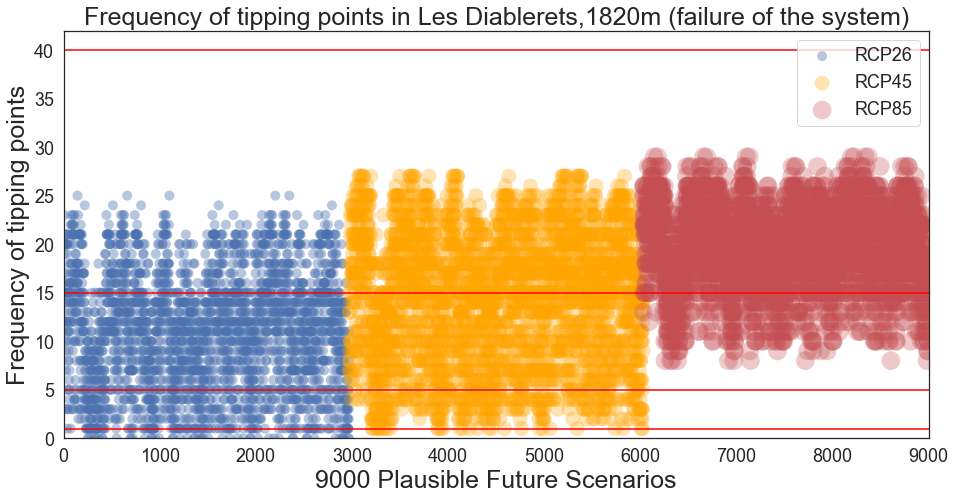

In [158]:
fig28, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)
fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.tiff'), format='tiff', dpi=150)

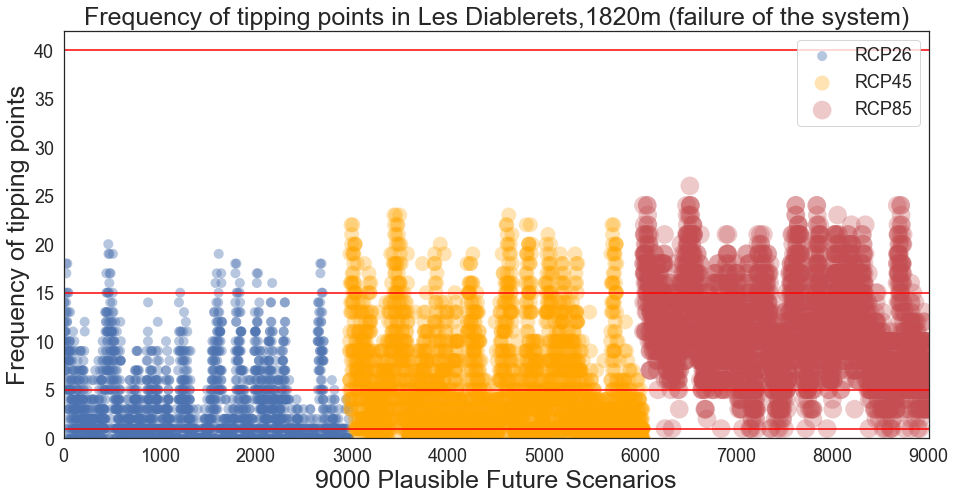

In [159]:
fig29, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.svg'), format='svg', dpi=1200)
fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.tiff'), format='tiff', dpi=150)

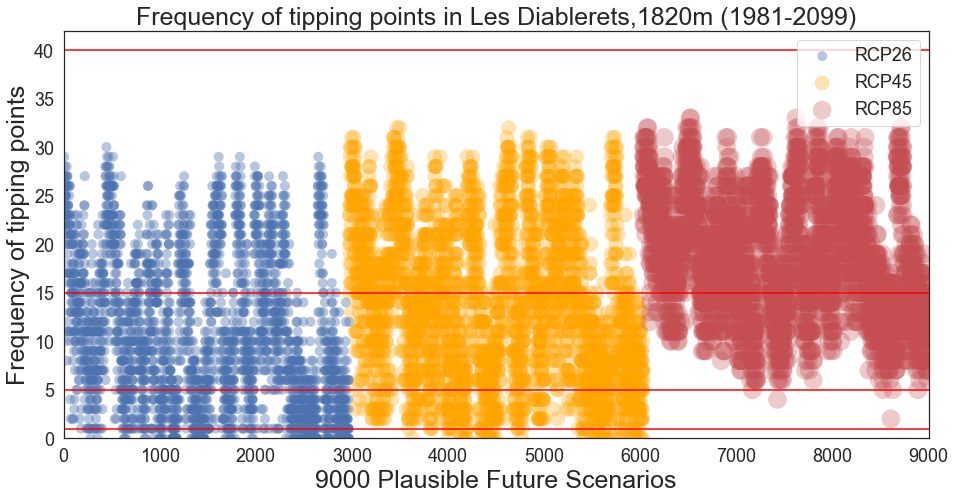

In [160]:
fig30, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.svg'), format='svg', dpi=1200)
fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.tiff'), format='tiff', dpi=150)

### Check the 45 policies

In [161]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,250.0,100.0,1,0,UZHModel,101.812049,14,82.364480,95.315560,132.371400,76.773800,63.795680,128.047920,132.957480,113.767880,133.261440,141.517240,73.480840,136.750360,135.151800,127.098960,113.981160,138.499840,115.001200,100.531240,33.677680,58.856160,...,25.344680,118.804480,71.518280,79.659520,14.511480,70.048760,104.418080,86.807720,29.114720,145.372880,83.107320,94.726680,89.621920,98.290400,96.421400,122.876240,85.650680,118.437120,83.550240,61.322800,147.738360,119.248000,104.974040,133.004800,75.570280,110.437400,58.981920,40.068920,95.728480,127.001920,82.633051,4.209237,0.746784,7.0
201,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,270.0,80.0,1,1,UZHModel,97.384068,14,76.263407,91.713185,127.681074,71.086852,59.070074,121.850852,131.409185,110.134000,128.932222,138.554296,68.912741,133.151593,129.367370,125.832370,109.225000,134.337889,112.603852,95.142222,31.183037,54.496444,...,23.467296,112.321407,66.220630,74.914296,13.436556,64.859963,101.779259,81.388037,26.958074,142.848741,76.951222,88.275630,85.204259,91.009630,93.090185,118.923889,79.319296,112.075296,77.361333,56.782519,144.188370,115.213185,100.930519,129.654630,69.972481,106.854741,54.612889,37.100852,90.381519,119.947185,82.633051,3.861186,0.778421,2.0
401,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,200.0,80.0,1,2,UZHModel,113.435764,14,99.690550,103.176100,145.742600,93.939100,79.299350,141.426300,136.833850,123.713000,144.143500,150.270000,85.106700,143.737150,148.373800,131.097000,126.512450,150.494000,120.847700,114.012250,42.097100,73.570200,...,31.680850,135.590750,86.567650,90.286200,18.139350,87.560950,110.974050,101.573150,36.393400,150.866700,101.580950,109.302700,101.671650,120.868850,104.723200,131.882450,103.435250,136.362550,101.585400,73.204950,153.925450,130.433600,115.887050,141.151500,94.021600,120.899650,73.727400,50.086150,106.563650,143.865850,82.633051,5.814237,0.812364,0.0
601,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,220.0,90.0,1,3,UZHModel,108.702810,14,92.664091,99.684045,140.093000,86.896455,72.495091,136.085818,135.330000,119.511636,139.562318,146.553136,80.563500,140.809500,142.836500,129.331273,121.520364,145.408909,118.429955,108.948909,38.270091,66.882000,...,28.800773,128.865318,80.283727,86.042136,16.490318,79.600864,108.423091,95.388318,33.084909,148.963864,94.160364,103.370636,96.631591,111.677864,101.721136,128.337636,96.438864,128.582727,94.499136,68.468091,151.765545,125.762682,111.274455,138.089545,85.864409,116.558091,67.024909,45.532864,102.566182,136.809909,82.633051,5.339576,0.790179,1.0
801,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.139774,2.0,200.0,90.0,1,4,UZHModel,113.435764,14,99.690550,103.176100,145.742600,93.939100,79.299350,141.426300,136.833850,123.713000,144.143500,150.270000,85.106700,143.737150,148.373800,131.097000,126.512450,150.494000,120.847700,114.012250,42.097100,73.570200,...,31.680850,135.590750,86.567650,90.286200,18.139350,87.560950,110.974050,101.573150,36.393400,150.866700,101.580950,109.302700,101.671650,120.868850,104.723200,131.882450,103.435250,136.362550,101.585400,73.204950,153.925450,130.433600,115.887050,141.151500,94.021600,120.899650,73.727400,50.086150,106.563650,143.865850,82.633051,5.814237,0.801070,0.0
1001,1.124616,1089.355373,4.648626,-1.556192,1.284382,0.

In [219]:
df_final_ema[filt_S].to_csv(os.path.join(rootVisualization, 'df_policies.csv'), index = False)

In [162]:
T1RCP26_m_3_1980 , tipping26_3_1980, scenario26_3_1980, policy26_3_1980= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2010, thresholds_26_pol_m, 30, thresholds_26_sce_m)
T1RCP45_m_3_1980 , tipping45_3_1980, scenario45_3_1980, policy45_3_1980= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2010, thresholds_45_pol_m, 30, thresholds_45_sce_m)
T1RCP85_m_3_1980 , tipping85_3_1980, scenario85_3_1980, policy85_3_1980= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2010, thresholds_85_pol_m, 30, thresholds_85_sce_m)

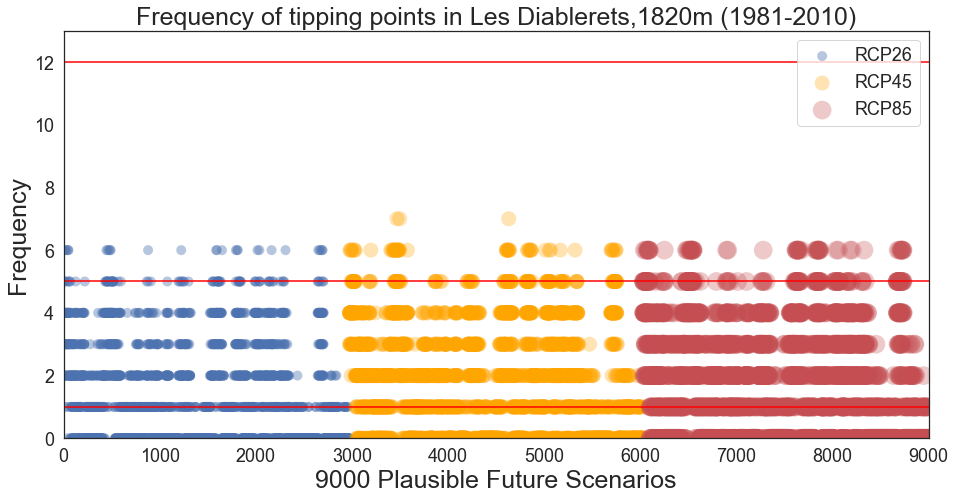

In [163]:
fig31, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_1980[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_1980[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_1980[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2010)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.svg'), format='svg', dpi=600)
fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.tiff'), format='tiff', dpi=150)

In [164]:
type(T1RCP85_m_3_1980)

numpy.ndarray

In [165]:
T1RCP26_m_3_1980_df = pd.DataFrame(T1RCP26_m_3_1980, columns =['tippingPoint26_1980'])
tipping26_3_1980_df = pd.DataFrame(tipping26_3_1980, columns =['tippingPoint26_1_1980'])
scenario26_3_1980_df = pd.DataFrame(scenario26_3_1980, columns =['scenario26_1980'])
policy26_3_1980_df = pd.DataFrame(policy26_3_1980, columns =['policy26_1980'])

T1RCP45_m_3_1980_df = pd.DataFrame(T1RCP45_m_3_1980, columns =['tippingPoint45_1980'])
tipping45_3_1980_df = pd.DataFrame(tipping45_3_1980, columns =['tippingPoint45_1_1980'])
scenario45_3_1980_df = pd.DataFrame(scenario45_3_1980, columns =['scenario45_1980'])
policy45_3_1980_df = pd.DataFrame(policy45_3_1980, columns =['policy45_1980'])

T1RCP85_m_3_1980_df = pd.DataFrame(T1RCP85_m_3_1980, columns =['tippingPoint85_1980'])
tipping85_3_1980_df = pd.DataFrame(tipping85_3_1980, columns =['tippingPoint85_1_1980'])
scenario85_3_1980_df = pd.DataFrame(scenario85_3_1980, columns =['scenario85_1980'])
policy85_3_1980_df = pd.DataFrame(policy85_3_1980, columns =['policy85_1980'])

In [220]:
df_final_tipping_point_1980 = pd.concat((T1RCP26_m_3_1980_df, tipping26_3_1980_df, scenario26_3_1980_df, policy26_3_1980_df,
                                         T1RCP45_m_3_1980_df, tipping45_3_1980_df, scenario45_3_1980_df, policy45_3_1980_df,
                                         T1RCP85_m_3_1980_df, tipping85_3_1980_df, scenario85_3_1980_df, policy85_3_1980_df), axis = 1)
df_final_tipping_point_1980.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_1980.csv'), index = False)

In [167]:
print(T1RCP26_m_3_1980_df['tippingPoint26_1980'].value_counts())
print(T1RCP45_m_3_1980_df['tippingPoint45_1980'].value_counts())
print(T1RCP85_m_3_1980_df['tippingPoint85_1980'].value_counts())

0.0    1485
2.0     478
1.0     434
4.0     247
3.0     218
5.0      82
6.0      27
Name: tippingPoint26_1980, dtype: int64
0.0    1278
2.0     504
1.0     469
4.0     343
3.0     283
5.0     127
6.0      54
7.0       3
Name: tippingPoint45_1980, dtype: int64
0.0    1254
1.0     448
2.0     420
3.0     337
4.0     314
5.0     142
6.0      56
Name: tippingPoint85_1980, dtype: int64


In [168]:
print(tipping26_3_1980_df['tippingPoint26_1_1980'].value_counts())
print(tipping45_3_1980_df['tippingPoint45_1_1980'].value_counts())
print(tipping85_3_1980_df['tippingPoint85_1_1980'].value_counts())

0.0    1484
2.0     478
1.0     434
4.0     247
3.0     218
5.0      82
6.0      27
Name: tippingPoint26_1_1980, dtype: int64
0.0    1277
2.0     504
1.0     469
4.0     343
3.0     283
5.0     127
6.0      54
7.0       3
Name: tippingPoint45_1_1980, dtype: int64
0.0    1253
1.0     448
2.0     420
3.0     337
4.0     314
5.0     142
6.0      56
Name: tippingPoint85_1_1980, dtype: int64


In [169]:
print(scenario26_3_1980_df['scenario26_1980'].value_counts())
print(scenario45_3_1980_df['scenario45_1980'].value_counts())
print(scenario85_3_1980_df['scenario85_1980'].value_counts())

43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
16    66
14    66
12    66
10    66
8     66
6     66
4     66
2     66
40    66
44    66
41    66
1     66
39    66
37    66
35    66
33    66
31    66
29    66
27    66
25    66
23    66
21    66
19    66
17    66
15    66
13    66
11    66
9     66
7     66
5     66
3     66
0     66
Name: scenario26_1980, dtype: int64
43    68
42    68
38    68
36    68
34    68
32    68
30    68
28    68
26    68
24    68
22    68
20    68
18    68
16    68
14    68
12    68
10    68
8     68
6     68
4     68
2     68
40    68
44    68
41    68
1     68
39    68
37    68
35    68
33    68
31    68
29    68
27    68
25    68
23    68
21    68
19    68
17    68
15    68
13    68
11    68
9     68
7     68
5     68
3     68
0     68
Name: scenario45_1980, dtype: int64
43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
1

In [170]:
print(policy26_3_1980_df['policy26_1980'].value_counts())
print(policy45_3_1980_df['policy45_1980'].value_counts())
print(policy85_3_1980_df['policy85_1980'].value_counts())

199    45
116    45
7      45
3      45
198    45
194    45
192    45
178    45
164    45
162    45
158    45
144    45
142    45
140    45
128    45
120    45
106    45
185    45
96     45
80     45
70     45
64     45
60     45
56     45
46     45
42     45
38     45
36     45
26     45
24     45
18     45
8      45
19     45
21     45
25     45
35     45
183    45
173    45
167    45
163    45
155    45
151    45
149    45
147    45
143    45
133    45
131    45
125    45
121    45
115    45
111    45
105    45
93     45
87     45
83     45
81     45
79     45
75     45
63     45
61     45
53     45
51     45
49     45
47     45
37     45
6      45
Name: policy26_1980, dtype: int64
195    45
130    45
92     45
100    45
102    45
108    45
114    45
126    45
138    45
193    45
148    45
150    45
154    45
156    45
160    45
170    45
88     45
86     45
82     45
76     45
72     45
66     45
62     45
58     45
54     45
50     45
44     45
32     45
28     45
20     45
14    

In [171]:
T1RCP26_m_3_2020 , tipping26_3_2020, scenario26_3_2020, policy26_3_2020= tipping_points_freq3(df26_all, thresholds_26_m, 2020, 2049, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2020 , tipping45_3_2020, scenario45_3_2020, policy45_3_2020= tipping_points_freq3(df45_all, thresholds_45_m, 2020, 2049, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2020 , tipping85_3_2020, scenario85_3_2020, policy85_3_2020= tipping_points_freq3(df85_all, thresholds_85_m, 2020, 2049, thresholds_85_pol_m, 5, thresholds_85_sce_m)

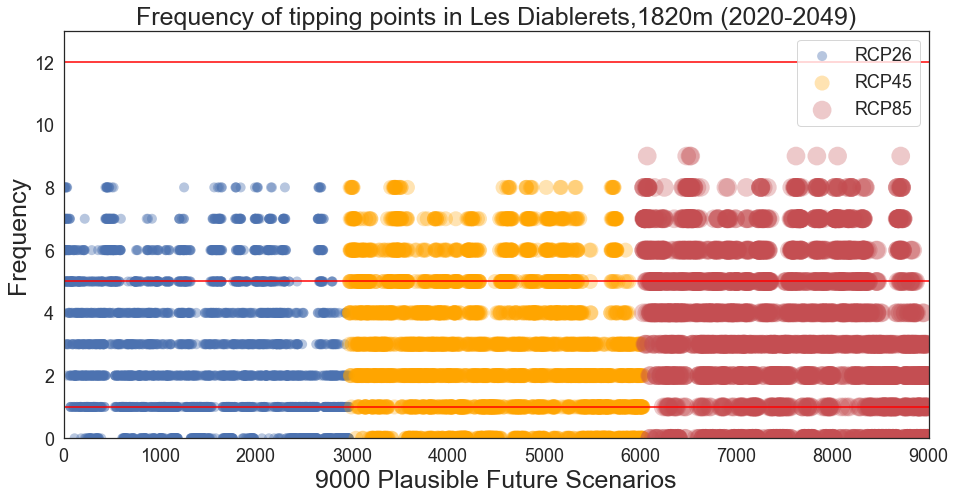

In [172]:
fig32, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2020[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2020[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2020[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2020-2049)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.svg'), format='svg', dpi=600)
fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.tiff'), format='tiff', dpi=150)

In [173]:
T1RCP26_m_3_2020_df = pd.DataFrame(T1RCP26_m_3_2020, columns =['tippingPoint26_2020'])
tipping26_3_2020_df = pd.DataFrame(tipping26_3_2020, columns =['tippingPoint26_1_2020'])
scenario26_3_2020_df = pd.DataFrame(scenario26_3_2020, columns =['scenario26_2020'])
policy26_3_2020_df = pd.DataFrame(policy26_3_2020, columns =['policy26_2020'])

T1RCP45_m_3_2020_df = pd.DataFrame(T1RCP45_m_3_2020, columns =['tippingPoint45_2020'])
tipping45_3_2020_df = pd.DataFrame(tipping45_3_2020, columns =['tippingPoint45_1_2020'])
scenario45_3_2020_df = pd.DataFrame(scenario45_3_2020, columns =['scenario45_2020'])
policy45_3_2020_df = pd.DataFrame(policy45_3_2020, columns =['policy45_2020'])

T1RCP85_m_3_2020_df = pd.DataFrame(T1RCP85_m_3_2020, columns =['tippingPoint85_2020'])
tipping85_3_2020_df = pd.DataFrame(tipping85_3_2020, columns =['tippingPoint85_1_2020'])
scenario85_3_2020_df = pd.DataFrame(scenario85_3_2020, columns =['scenario85_2020'])
policy85_3_2020_df = pd.DataFrame(policy85_3_2020, columns =['policy85_2020'])

In [221]:
df_final_tipping_point_2020 = pd.concat((T1RCP26_m_3_2020_df, tipping26_3_2020_df, scenario26_3_2020_df, policy26_3_2020_df,
                                         T1RCP45_m_3_2020_df, tipping45_3_2020_df, scenario45_3_2020_df, policy45_3_2020_df,
                                         T1RCP85_m_3_2020_df, tipping85_3_2020_df, scenario85_3_2020_df, policy85_3_2020_df), axis = 1)
df_final_tipping_point_2020.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2020.csv'), index = False)

In [175]:
print(T1RCP26_m_3_2020_df['tippingPoint26_2020'].value_counts())
print(T1RCP45_m_3_2020_df['tippingPoint45_2020'].value_counts())
print(T1RCP85_m_3_2020_df['tippingPoint85_2020'].value_counts())

1.0    615
0.0    528
2.0    487
5.0    343
3.0    302
4.0    292
6.0    239
7.0    125
8.0     40
Name: tippingPoint26_2020, dtype: int64
0.0    530
1.0    507
2.0    481
3.0    411
4.0    335
5.0    311
6.0    258
7.0    181
8.0     47
Name: tippingPoint45_2020, dtype: int64
3.0    460
0.0    433
2.0    400
5.0    369
4.0    368
6.0    333
7.0    252
1.0    243
8.0    105
9.0      8
Name: tippingPoint85_2020, dtype: int64


In [176]:
print(tipping26_3_2020_df['tippingPoint26_1_2020'].value_counts())
print(tipping45_3_2020_df['tippingPoint45_1_2020'].value_counts())
print(tipping85_3_2020_df['tippingPoint85_1_2020'].value_counts())

1.0    615
0.0    527
2.0    487
3.0    302
4.0    292
Name: tippingPoint26_1_2020, dtype: int64
0.0    529
1.0    507
2.0    481
3.0    411
4.0    335
Name: tippingPoint45_1_2020, dtype: int64
3.0    460
0.0    432
2.0    400
4.0    368
1.0    243
Name: tippingPoint85_1_2020, dtype: int64


In [177]:
print(scenario26_3_2020_df['scenario26_2020'].value_counts())
print(scenario45_3_2020_df['scenario45_2020'].value_counts())
print(scenario85_3_2020_df['scenario85_2020'].value_counts())

43    66
21    66
20    66
22    66
38    66
41    66
9     66
15    66
17    66
44    66
39    66
37    66
29    66
25    66
26    65
36    65
12    64
10    64
42    63
35    63
33    57
5     57
4     57
28    56
3     52
16    49
31    48
13    46
2     45
11    44
14    44
19    41
8     40
1     38
34    35
23    33
18    30
6     30
32    27
30    18
40    17
24    16
27    14
0     12
7      9
Name: scenario26_2020, dtype: int64
43    68
21    68
20    68
38    68
9     68
17    68
44    68
39    68
37    68
29    67
25    67
22    67
15    67
41    67
12    66
35    65
26    65
36    65
42    64
10    64
4     64
5     60
28    57
11    54
33    52
31    52
3     50
16    47
2     46
14    46
19    42
1     41
13    41
8     36
34    35
6     32
23    29
32    24
18    23
40    20
30    19
0     17
27    16
24    14
7     10
Name: scenario45_2020, dtype: int64
44    66
17    66
39    66
38    66
37    66
21    66
43    66
20    65
41    64
29    63
15    63
22    63
9     62
2

In [178]:
print(policy26_3_2020_df['policy26_2020'].value_counts())
print(policy45_3_2020_df['policy45_2020'].value_counts())
print(policy85_3_2020_df['policy85_2020'].value_counts())

106    37
162    37
3      36
140    36
7      36
121    36
178    36
163    36
18     36
38     35
149    35
51     35
192    35
79     35
155    35
198    35
47     35
144    35
87     35
83     35
158    35
164    34
199    34
142    34
120    34
80     34
70     34
60     34
36     34
24     34
128    34
21     34
6      34
173    34
167    34
61     34
143    34
93     34
111    33
8      33
183    33
151    33
42     33
56     33
115    33
116    33
105    33
19     33
35     33
37     33
53     33
81     32
26     32
194    32
63     32
75     32
131    32
185    32
25     32
133    31
49     31
96     31
125    31
147    30
64     30
46     30
Name: policy26_2020, dtype: int64
148    39
127    39
150    38
54     37
88     37
91     37
123    37
72     37
193    37
172    36
73     35
44     35
190    35
103    35
14     35
161    35
126    35
170    34
86     34
0      34
76     34
97     34
69     34
153    34
10     34
71     34
99     34
67     33
189    33
92     33
100   

In [179]:
T1RCP26_m_3_2050 , tipping26_3_2050, scenario26_3_2050, policy26_3_2050= tipping_points_freq3(df26_all, thresholds_26_m, 2050, 2079, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2050 , tipping45_3_2050, scenario45_3_2050, policy45_3_2050= tipping_points_freq3(df45_all, thresholds_45_m, 2050, 2079, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2050 , tipping85_3_2050, scenario85_3_2050, policy85_3_2050= tipping_points_freq3(df85_all, thresholds_85_m, 2050, 2079, thresholds_85_pol_m, 5, thresholds_85_sce_m)

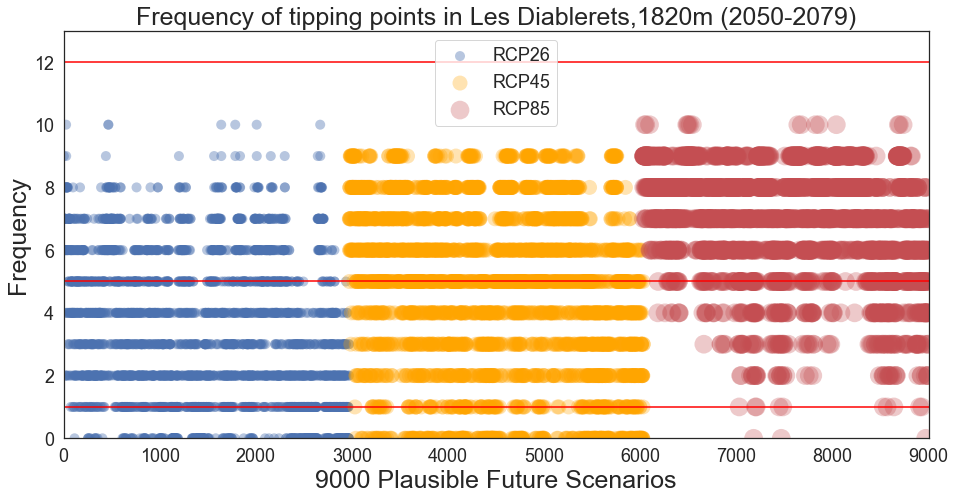

In [180]:
fig33, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2050[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2050[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2050[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2050-2079)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.svg'), format='svg', dpi=600)
fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.tiff'), format='tiff', dpi=150)

In [181]:
T1RCP26_m_3_2050_df = pd.DataFrame(T1RCP26_m_3_2050, columns =['tippingPoint26_2050'])
tipping26_3_2050_df = pd.DataFrame(tipping26_3_2050, columns =['tippingPoint26_1_2050'])
scenario26_3_2050_df = pd.DataFrame(scenario26_3_2050, columns =['scenario26_2050'])
policy26_3_2050_df = pd.DataFrame(policy26_3_2050, columns =['policy26_2050'])

T1RCP45_m_3_2050_df = pd.DataFrame(T1RCP45_m_3_2050, columns =['tippingPoint45_2050'])
tipping45_3_2050_df = pd.DataFrame(tipping45_3_2050, columns =['tippingPoint45_1_2050'])
scenario45_3_2050_df = pd.DataFrame(scenario45_3_2050, columns =['scenario45_2050'])
policy45_3_2050_df = pd.DataFrame(policy45_3_2050, columns =['policy45_2050'])

T1RCP85_m_3_2050_df = pd.DataFrame(T1RCP85_m_3_2050, columns =['tippingPoint85_2050'])
tipping85_3_2050_df = pd.DataFrame(tipping85_3_2050, columns =['tippingPoint85_1_2050'])
scenario85_3_2050_df = pd.DataFrame(scenario85_3_2050, columns =['scenario85_2050'])
policy85_3_2050_df = pd.DataFrame(policy85_3_2050, columns =['policy85_2050'])

In [222]:
df_final_tipping_point_2050 = pd.concat((T1RCP26_m_3_2050_df, tipping26_3_2050_df, scenario26_3_2050_df, policy26_3_2050_df,
                                         T1RCP45_m_3_2050_df, tipping45_3_2050_df, scenario45_3_2050_df, policy45_3_2050_df,
                                         T1RCP85_m_3_2050_df, tipping85_3_2050_df, scenario85_3_2050_df, policy85_3_2050_df), axis = 1)
df_final_tipping_point_2050.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2050.csv'), index = False)

In [183]:
print(T1RCP26_m_3_2050_df['tippingPoint26_2050'].value_counts())
print(T1RCP45_m_3_2050_df['tippingPoint45_2050'].value_counts())
print(T1RCP85_m_3_2050_df['tippingPoint85_2050'].value_counts())

2.0     552
1.0     402
0.0     350
5.0     348
4.0     347
6.0     323
3.0     307
7.0     237
8.0      85
9.0      13
10.0      7
Name: tippingPoint26_2050, dtype: int64
5.0    446
6.0    433
8.0    380
7.0    310
0.0    305
4.0    302
3.0    287
2.0    250
9.0    176
1.0    172
Name: tippingPoint45_2050, dtype: int64
8.0     772
7.0     604
9.0     573
6.0     467
5.0     238
4.0     150
3.0      93
2.0      44
10.0     16
1.0      10
0.0       4
Name: tippingPoint85_2050, dtype: int64


In [184]:
print(tipping26_3_2050_df['tippingPoint26_1_2050'].value_counts())
print(tipping45_3_2050_df['tippingPoint45_1_2050'].value_counts())
print(tipping85_3_2050_df['tippingPoint85_1_2050'].value_counts())

2.0    552
1.0    402
0.0    349
4.0    347
3.0    307
Name: tippingPoint26_1_2050, dtype: int64
0.0    304
4.0    302
3.0    287
2.0    250
1.0    172
Name: tippingPoint45_1_2050, dtype: int64
4.0    150
3.0     93
2.0     44
1.0     10
0.0      3
Name: tippingPoint85_1_2050, dtype: int64


In [185]:
print(scenario26_3_2050_df['scenario26_2050'].value_counts())
print(scenario45_3_2050_df['scenario45_2050'].value_counts())
print(scenario85_3_2050_df['scenario85_2050'].value_counts())

43    66
17    66
39    66
38    66
21    66
44    65
20    64
15    63
37    63
22    62
36    62
41    61
29    61
26    60
9     60
25    60
12    59
42    58
10    56
35    53
4     51
5     51
28    45
16    44
3     41
33    39
14    38
31    36
2     33
19    33
1     32
11    32
8     31
13    29
23    24
34    23
6     20
18    19
32    18
30    17
40    16
24    16
0     13
27    11
7      8
Name: scenario26_2050, dtype: int64
21    64
43    63
17    62
39    61
38    61
44    54
37    52
15    50
20    48
41    45
9     42
22    41
36    41
25    40
26    39
12    38
35    37
29    36
42    34
4     30
10    25
3     25
5     25
33    24
14    23
16    22
11    21
28    20
19    19
31    19
2     18
13    16
1     16
8     16
34    13
6     12
23    12
32    10
30    10
18     8
40     7
27     5
24     4
0      4
7      3
Name: scenario45_2050, dtype: int64
17    31
21    29
44    26
38    24
43    22
39    21
37    20
15    17
26    15
36    13
20    11
22    11
41    10
2

In [186]:
print(policy26_3_2050_df['policy26_2050'].value_counts())
print(policy45_3_2050_df['policy45_2050'].value_counts())
print(policy85_3_2050_df['policy85_2050'].value_counts())

60     35
158    34
106    34
140    33
38     33
147    33
155    33
80     32
47     32
121    32
25     32
199    32
75     32
192    32
63     31
61     31
96     31
7      31
163    31
128    31
162    31
120    31
142    31
143    31
144    31
164    31
49     30
19     30
6      30
83     30
198    30
167    30
115    30
116    30
178    30
46     30
185    30
8      29
56     29
24     29
3      29
183    29
81     29
173    29
105    29
37     28
125    28
18     28
151    28
21     28
93     28
51     28
79     28
70     27
26     27
149    27
53     27
87     27
64     27
36     26
35     26
111    26
194    26
42     25
133    25
131    24
Name: policy26_2050, dtype: int64
14     25
54     25
172    25
88     24
127    24
91     23
177    23
73     22
99     22
17     22
76     22
23     22
44     22
58     22
108    22
67     21
66     21
95     21
55     21
102    21
0      21
10     21
130    20
148    20
193    20
161    20
160    20
77     20
126    20
50     20
138   

In [187]:
T1RCP26_m_3_2070 , tipping26_3_2070, scenario26_3_2070, policy26_3_2070= tipping_points_freq3(df26_all, thresholds_26_m, 2070, 2097, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2070 , tipping45_3_2070, scenario45_3_2070, policy45_3_2070= tipping_points_freq3(df45_all, thresholds_45_m, 2070, 2097, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2070 , tipping85_3_2070, scenario85_3_2070, policy85_3_2070= tipping_points_freq3(df85_all, thresholds_85_m, 2070, 2097, thresholds_85_pol_m, 5, thresholds_85_sce_m)

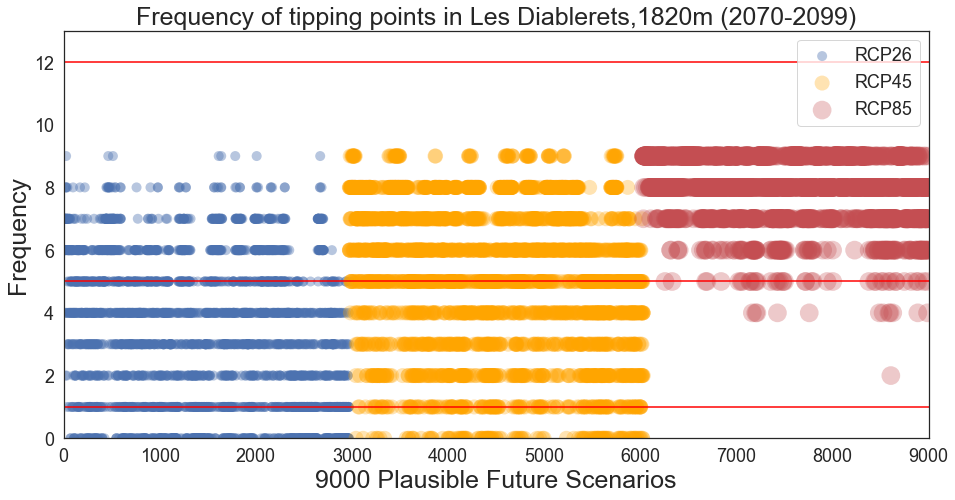

In [188]:
fig34, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2070[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2070[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2070[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2070-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.svg'), format='svg', dpi=600)
fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.tiff'), format='tiff', dpi=150)

In [189]:
T1RCP26_m_3_2070_df = pd.DataFrame(T1RCP26_m_3_2070, columns =['tippingPoint26_2070'])
tipping26_3_2070_df = pd.DataFrame(tipping26_3_2070, columns =['tippingPoint26_1_2070'])
scenario26_3_2070_df = pd.DataFrame(scenario26_3_2070, columns =['scenario26_2070'])
policy26_3_2070_df = pd.DataFrame(policy26_3_2070, columns =['policy26_2070'])

T1RCP45_m_3_2070_df = pd.DataFrame(T1RCP45_m_3_2070, columns =['tippingPoint45_2070'])
tipping45_3_2070_df = pd.DataFrame(tipping45_3_2070, columns =['tippingPoint45_1_2070'])
scenario45_3_2070_df = pd.DataFrame(scenario45_3_2070, columns =['scenario45_2070'])
policy45_3_2070_df = pd.DataFrame(policy45_3_2070, columns =['policy45_2070'])

T1RCP85_m_3_2070_df = pd.DataFrame(T1RCP85_m_3_2070, columns =['tippingPoint85_2070'])
tipping85_3_2070_df = pd.DataFrame(tipping85_3_2070, columns =['tippingPoint85_1_2070'])
scenario85_3_2070_df = pd.DataFrame(scenario85_3_2070, columns =['scenario85_2070'])
policy85_3_2070_df = pd.DataFrame(policy85_3_2070, columns =['policy85_2070'])

In [223]:
df_final_tipping_point_2070 = pd.concat((T1RCP26_m_3_2070_df, tipping26_3_2070_df, scenario26_3_2070_df, policy26_3_2070_df,
                                         T1RCP45_m_3_2070_df, tipping45_3_2070_df, scenario45_3_2070_df, policy45_3_2070_df,
                                         T1RCP85_m_3_2070_df, tipping85_3_2070_df, scenario85_3_2070_df, policy85_3_2070_df), axis = 1)
df_final_tipping_point_2070.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2070.csv'), index = False)

In [191]:
print(T1RCP26_m_3_2070_df['tippingPoint26_2070'].value_counts())
print(T1RCP45_m_3_2070_df['tippingPoint45_2070'].value_counts())
print(T1RCP85_m_3_2070_df['tippingPoint85_2070'].value_counts())

0.0    506
1.0    431
4.0    419
6.0    368
5.0    354
3.0    343
2.0    271
7.0    221
8.0     50
9.0      8
Name: tippingPoint26_2070, dtype: int64
8.0    542
6.0    501
5.0    431
7.0    407
4.0    294
2.0    266
3.0    225
1.0    181
0.0    130
9.0     84
Name: tippingPoint45_2070, dtype: int64
9.0    1195
8.0    1040
7.0     530
6.0     150
5.0      42
4.0      12
2.0       1
0.0       1
Name: tippingPoint85_2070, dtype: int64


In [192]:
print(tipping26_3_2070_df['tippingPoint26_1_2070'].value_counts())
print(tipping45_3_2070_df['tippingPoint45_1_2070'].value_counts())
print(tipping85_3_2070_df['tippingPoint85_1_2070'].value_counts())

0.0    505
1.0    431
4.0    419
3.0    343
2.0    271
Name: tippingPoint26_1_2070, dtype: int64
4.0    294
2.0    266
3.0    225
1.0    181
0.0    129
Name: tippingPoint45_1_2070, dtype: int64
4.0    12
2.0     1
Name: tippingPoint85_1_2070, dtype: int64


In [193]:
print(scenario26_3_2070_df['scenario26_2070'].value_counts())
print(scenario45_3_2070_df['scenario45_2070'].value_counts())
print(scenario85_3_2070_df['scenario85_2070'].value_counts())

39    66
17    66
38    65
20    65
21    65
43    64
44    63
37    63
29    62
9     62
41    62
12    61
15    61
25    61
22    61
26    60
36    60
35    60
42    57
10    54
28    51
4     49
16    45
5     43
31    41
14    39
3     39
33    38
11    37
2     35
1     35
19    35
8     33
13    24
34    23
23    23
30    18
18    18
32    18
24    18
6     17
40    15
0     14
27    13
7     10
Name: scenario26_2070, dtype: int64
17    57
21    56
38    51
39    48
43    47
44    43
37    43
15    39
41    36
20    35
22    35
36    33
9     32
26    32
29    31
25    31
12    30
35    30
42    29
4     23
10    23
16    22
28    22
5     21
33    21
11    20
31    20
3     19
14    16
2     16
19    16
1     15
13    14
34    13
8     13
23    11
32    10
18     9
6      9
30     6
24     5
40     5
27     3
7      3
0      2
Name: scenario45_2070, dtype: int64
17    3
39    2
38    2
37    2
44    1
43    1
26    1
21    1
Name: scenario85_2070, dtype: int64


In [194]:
print(policy26_3_2070_df['policy26_2070'].value_counts())
print(policy45_3_2070_df['policy45_2070'].value_counts())
print(policy85_3_2070_df['policy85_2070'].value_counts())

61     35
56     34
25     34
199    33
162    33
198    33
75     33
60     33
149    33
158    33
144    33
192    33
80     32
121    32
155    32
6      32
19     32
143    32
142    32
140    32
96     31
106    31
63     31
8      31
178    31
163    31
164    31
38     31
81     31
147    31
167    31
128    31
49     30
7      30
26     30
3      30
115    30
120    30
83     29
183    29
47     29
116    29
125    29
79     29
105    28
35     28
36     28
37     28
18     28
185    28
51     28
194    28
46     27
64     27
173    27
53     27
133    27
151    27
24     27
21     27
93     25
87     25
70     25
131    24
111    24
42     24
Name: policy26_2070, dtype: int64
23     22
0      20
55     20
108    20
127    20
88     20
91     19
161    19
193    19
195    19
177    18
14     18
100    18
43     18
1      18
135    18
130    18
97     17
103    17
117    17
71     17
95     17
66     17
27     17
172    17
69     16
54     16
77     16
86     16
50     16
44    

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [195]:
from scipy.integrate import simps

def area_max_min_df (df, a, b, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario[a:b], dx=1)
    areamin1 = trapz(min_scenario[a:b], dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario[a:b], dx=1)
    areamin2 = simps(min_scenario[a:b], dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [196]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [197]:
max_scenario.to_numpy()

array([99.76917857, 99.94819231, 98.7315    , 99.798375  , 99.97318182,
       99.88763636, 99.7326    , 99.83825   , 99.59606667, 99.91823077,
       99.8691    , 99.9861    , 99.85746667, 99.92757143, 99.90724138,
       99.7897037 , 99.51896296, 99.65368966, 99.67129167, 99.97235   ,
       99.95857143, 99.91135714, 99.70744444, 99.73880769, 99.44225   ,
       99.96529167, 99.99210714, 99.92537037, 99.99662963, 99.426     ,
       98.80503333, 99.875375  , 99.96356   , 99.81353846, 99.95066667,
       99.99196154, 99.75683333, 99.51111111, 99.99738462, 99.95331818,
       99.92696552, 99.99920833, 99.8418    , 99.99142308, 99.99468182,
       99.87365   , 99.6353    , 99.99152   , 99.91533333, 99.77775   ,
       99.8027931 , 99.88480769, 99.87185714, 99.69685   , 99.98613636,
       99.5978    , 99.98048   , 99.75558333, 99.9197    , 99.88858621,
       99.90556   , 99.95571429, 99.90513636, 99.84055556, 99.98936667,
       99.98424   , 99.772     , 99.88948   , 99.9622    , 99.59

In [198]:
min_scenario.to_numpy()

array([100.03563333, 100.08376667, 100.14405   , 100.146625  ,
       100.28844828, 100.13416667, 100.01982143, 100.21024138,
       100.29043333, 100.25296154, 100.07514286, 100.3495    ,
       100.09148276, 100.07225   , 100.2482069 , 100.22510345,
       100.16524138, 100.27111111, 100.50595   , 100.05443333,
       100.47780769, 100.00407692, 100.69619231, 100.24288   ,
        10.00827586, 100.02008333, 100.0542    , 100.16537931,
       100.05336   , 100.01589655, 100.12176667,  10.03455172,
       100.71135   , 100.05584615, 100.15945833, 100.14672414,
       100.06213793, 100.77080769, 100.24745833, 100.15322727,
       100.0007    , 100.24790909, 100.02793103, 100.14742857,
       100.19445833, 100.05621429, 100.04351852, 100.00862963,
       100.13513636, 100.06042308, 100.18182143, 100.04434615,
        10.56655   ,  10.13435   , 100.09848   , 100.20486667,
       100.0256    ,  10.74256667, 100.18554167,  10.15818182,
        10.09833333, 100.00940909, 100.38413333, 100.06

In [199]:
max_scenario.shape

(118,)

## Changes in Good Days

In [200]:
max_scenario.to_numpy()

array([99.76917857, 99.94819231, 98.7315    , 99.798375  , 99.97318182,
       99.88763636, 99.7326    , 99.83825   , 99.59606667, 99.91823077,
       99.8691    , 99.9861    , 99.85746667, 99.92757143, 99.90724138,
       99.7897037 , 99.51896296, 99.65368966, 99.67129167, 99.97235   ,
       99.95857143, 99.91135714, 99.70744444, 99.73880769, 99.44225   ,
       99.96529167, 99.99210714, 99.92537037, 99.99662963, 99.426     ,
       98.80503333, 99.875375  , 99.96356   , 99.81353846, 99.95066667,
       99.99196154, 99.75683333, 99.51111111, 99.99738462, 99.95331818,
       99.92696552, 99.99920833, 99.8418    , 99.99142308, 99.99468182,
       99.87365   , 99.6353    , 99.99152   , 99.91533333, 99.77775   ,
       99.8027931 , 99.88480769, 99.87185714, 99.69685   , 99.98613636,
       99.5978    , 99.98048   , 99.75558333, 99.9197    , 99.88858621,
       99.90556   , 99.95571429, 99.90513636, 99.84055556, 99.98936667,
       99.98424   , 99.772     , 99.88948   , 99.9622    , 99.59

In [201]:
max_scenario.shape

(118,)

In [202]:
min_scenario.to_numpy()

array([100.03563333, 100.08376667, 100.14405   , 100.146625  ,
       100.28844828, 100.13416667, 100.01982143, 100.21024138,
       100.29043333, 100.25296154, 100.07514286, 100.3495    ,
       100.09148276, 100.07225   , 100.2482069 , 100.22510345,
       100.16524138, 100.27111111, 100.50595   , 100.05443333,
       100.47780769, 100.00407692, 100.69619231, 100.24288   ,
        10.00827586, 100.02008333, 100.0542    , 100.16537931,
       100.05336   , 100.01589655, 100.12176667,  10.03455172,
       100.71135   , 100.05584615, 100.15945833, 100.14672414,
       100.06213793, 100.77080769, 100.24745833, 100.15322727,
       100.0007    , 100.24790909, 100.02793103, 100.14742857,
       100.19445833, 100.05621429, 100.04351852, 100.00862963,
       100.13513636, 100.06042308, 100.18182143, 100.04434615,
        10.56655   ,  10.13435   , 100.09848   , 100.20486667,
       100.0256    ,  10.74256667, 100.18554167,  10.15818182,
        10.09833333, 100.00940909, 100.38413333, 100.06

In [203]:
df26_all_1 = df26_all.iloc[:, 1:]
df45_all_1 = df45_all.iloc[:, 1:]
df85_all_1 = df85_all.iloc[:, 1:]

In [204]:
print("1981-2010")
area_max_min_df(df26_all_1, 0, 30, 30)
area_max_min_df(df45_all_1, 0, 30, 30)
area_max_min_df(df85_all_1, 0, 30, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

1981-2010
Start************************************************************
Uncertainty Band1 =95.16 days
Uncertainty Band2 =95.16 days
****************************************End

Start************************************************************
Uncertainty Band1 =95.19 days
Uncertainty Band2 =95.19 days
****************************************End

Start************************************************************
Uncertainty Band1 =95.21 days
Uncertainty Band2 =95.21 days
****************************************End



In [205]:
print("2021-2050")
area_max_min_df(df26_all_1, 40, 70, 30)
area_max_min_df(df45_all_1, 40, 70, 30)
area_max_min_df(df85_all_1, 40, 70, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2021-2050
Start************************************************************
Uncertainty Band1 =86.19 days
Uncertainty Band2 =86.19 days
****************************************End

Start************************************************************
Uncertainty Band1 =84.65 days
Uncertainty Band2 =84.90 days
****************************************End

Start************************************************************
Uncertainty Band1 =79.48 days
Uncertainty Band2 =79.61 days
****************************************End



In [206]:
print("2051-2080")
area_max_min_df(df26_all_1, 70, 100, 30)
area_max_min_df(df45_all_1, 70, 100, 30)
area_max_min_df(df85_all_1, 70, 100, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2051-2080
Start************************************************************
Uncertainty Band1 =84.69 days
Uncertainty Band2 =84.69 days
****************************************End

Start************************************************************
Uncertainty Band1 =75.64 days
Uncertainty Band2 =75.64 days
****************************************End

Start************************************************************
Uncertainty Band1 =58.99 days
Uncertainty Band2 =58.98 days
****************************************End



In [207]:
print("2071-2100")
area_max_min_df(df26_all_1, 90, 119, 30)
area_max_min_df(df45_all_1, 90, 119, 30)
area_max_min_df(df85_all_1, 90, 119, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)

2071-2100
Start************************************************************
Uncertainty Band1 =77.23 days
Uncertainty Band2 =77.22 days
****************************************End

Start************************************************************
Uncertainty Band1 =59.92 days
Uncertainty Band2 =59.80 days
****************************************End

Start************************************************************
Uncertainty Band1 =44.76 days
Uncertainty Band2 =44.76 days
****************************************End



## Changes in Financial situation

In [208]:
df26_all_fin_1 = df26_all_fin.iloc[:, 1:]
df45_all_fin_1 = df45_all_fin.iloc[:, 1:]
df85_all_fin_1 = df85_all_fin.iloc[:, 1:]

In [209]:
max_scenario = df26_all_fin_1.max(axis=1)
min_scenario = df26_all_fin_1.min(axis=1)

In [210]:
print("1981-2010")
area_max_min_df(df26_all_fin_1, 0, 30, 30)
area_max_min_df(df45_all_fin_1, 0, 30, 30)
area_max_min_df(df85_all_fin_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =4.51 days
Uncertainty Band2 =4.51 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.43 days
Uncertainty Band2 =4.43 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.39 days
Uncertainty Band2 =4.39 days
****************************************End



In [211]:
print("2021-2050")
area_max_min_df(df26_all_fin_1, 40, 70, 30)
area_max_min_df(df45_all_fin_1, 40, 70, 30)
area_max_min_df(df85_all_fin_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =4.13 days
Uncertainty Band2 =4.13 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.06 days
Uncertainty Band2 =4.06 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.90 days
Uncertainty Band2 =3.90 days
****************************************End



In [212]:
print("2051-2080")
area_max_min_df(df26_all_fin_1, 70, 100, 30)
area_max_min_df(df45_all_fin_1, 70, 100, 30)
area_max_min_df(df85_all_fin_1, 70, 100, 30)


2051-2080
Start************************************************************
Uncertainty Band1 =3.99 days
Uncertainty Band2 =3.99 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.84 days
Uncertainty Band2 =3.84 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.32 days
Uncertainty Band2 =3.32 days
****************************************End



In [213]:
print("2071-2100")
area_max_min_df(df26_all_fin_1, 90, 119, 30)
area_max_min_df(df45_all_fin_1, 90, 119, 30)
area_max_min_df(df85_all_fin_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =3.80 days
Uncertainty Band2 =3.80 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.45 days
Uncertainty Band2 =3.45 days
****************************************End

Start************************************************************
Uncertainty Band1 =2.60 days
Uncertainty Band2 =2.59 days
****************************************End



## Changes in Artificial Snow

In [214]:
df26_all_Art_1 = df26_all_Art.iloc[:, 1:]
df45_all_Art_1 = df45_all_Art.iloc[:, 1:]
df85_all_Art_1 = df85_all_Art.iloc[:, 1:]

In [215]:
print("1981-2010")
area_max_min_df(df26_all_Art_1, 0, 30, 30)
area_max_min_df(df45_all_Art_1, 0, 30, 30)
area_max_min_df(df85_all_Art_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =96.81 days
Uncertainty Band2 =96.81 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.73 days
Uncertainty Band2 =96.73 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.61 days
Uncertainty Band2 =96.61 days
****************************************End



In [216]:
print("2021-2050")
area_max_min_df(df26_all_Art_1, 40, 70, 30)
area_max_min_df(df45_all_Art_1, 40, 70, 30)
area_max_min_df(df85_all_Art_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =95.24 days
Uncertainty Band2 =95.26 days
****************************************End

Start************************************************************
Uncertainty Band1 =94.58 days
Uncertainty Band2 =94.49 days
****************************************End

Start************************************************************
Uncertainty Band1 =93.53 days
Uncertainty Band2 =93.54 days
****************************************End



In [217]:
print("2051-2080")
area_max_min_df(df26_all_Art_1, 70, 100, 30)
area_max_min_df(df45_all_Art_1, 70, 100, 30)
area_max_min_df(df85_all_Art_1, 70, 100, 30)

2051-2080
Start************************************************************
Uncertainty Band1 =94.29 days
Uncertainty Band2 =94.29 days
****************************************End

Start************************************************************
Uncertainty Band1 =86.93 days
Uncertainty Band2 =86.96 days
****************************************End

Start************************************************************
Uncertainty Band1 =63.54 days
Uncertainty Band2 =63.53 days
****************************************End



In [218]:
print("2071-2100")
area_max_min_df(df26_all_Art_1, 90, 119, 30)
area_max_min_df(df45_all_Art_1, 90, 119, 30)
area_max_min_df(df85_all_Art_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =88.46 days
Uncertainty Band2 =88.39 days
****************************************End

Start************************************************************
Uncertainty Band1 =74.57 days
Uncertainty Band2 =74.57 days
****************************************End

Start************************************************************
Uncertainty Band1 =36.97 days
Uncertainty Band2 =36.98 days
****************************************End



## End